In [ ]:
import polars as pl

# Load the Parquet file efficiently
df = pl.read_parquet("/kaggle/input/stock-market-1/final_cleaned.parquet")  # Replace with your actual file path

# Loop through each column and print required info
for col in df.columns:
    dtype = df[col].dtype
    missing = df[col].null_count()
    print(f"Column: {col}")
    print(f"  Data Type: {dtype}")
    print(f"  Missing Values: {missing}")
    print("-" * 40)


In [ ]:
import polars as pl

# Load the CSV
tickers_df = pl.read_csv("/kaggle/input/nifty100-tickers/MW-NIFTY-100-11-Apr-2025.csv")

# Clean column names (strip spaces)
tickers_df = tickers_df.rename({col: col.strip() for col in tickers_df.columns})

# Now access the cleaned "SYMBOL" column safely
tickers_list = tickers_df["SYMBOL"].to_list()

# Load the Parquet file
data_df = pl.read_parquet("/kaggle/input/stock-market-1/final_cleaned.parquet")

# Filter rows where Company_ID is in tickers list
filtered_df = data_df.filter(pl.col("Company_ID").is_in(tickers_list))

# Display the result
print(filtered_df)


In [ ]:
# Save the filtered DataFrame to a Parquet file
filtered_df.write_parquet("NSE100-ClusterGAN.parquet")

In [ ]:
print(tickers_list)

In [ ]:
!pip install fitter

In [ ]:
from fitter import get_common_distributions, get_distributions

print(get_distributions())         # full list (~80+)


In [ ]:
import pandas as pd
import numpy as np
from fitter import Fitter, get_common_distributions

def fit_distributions_from_parquet(path, sample_size=10000, distributions=None):
    df = pd.read_parquet(path)
    df_numeric = df.select_dtypes(include=[np.number])

    result = []
    total_cols = len(df_numeric.columns)

    print(f"\n📊 Starting distribution fitting on {total_cols} numeric columns...\n")

    for idx, col in enumerate(df_numeric.columns, start=1):
        print(f"🔁 [{idx}/{total_cols}] Processing column: {col}")
        series = df_numeric[col].dropna()

        if series.nunique() <= 1:
            print(f"   ⏩ Skipped (constant column)")
            result.append({
                'Column': col,
                'Best_Distribution': 'constant',
                'Parameters': None,
                'SSE': None
            })
            continue

        # Sample if too large
        if len(series) > sample_size:
            series = series.sample(sample_size, random_state=42)

        try:
            f = Fitter(
                series,
                distributions=distributions or get_common_distributions(),
                timeout=15  # optional: timeout per dist
            )
            f.fit()
            best = f.get_best(method='sumsquare_error')
            dist_name = list(best.keys())[0]
            params = best[dist_name]

            result.append({
                'Column': col,
                'Best_Distribution': dist_name,
                'Parameters': params,
                'SSE': f.summary().iloc[0]['sumsquare_error']
            })

            print(f"   ✅ Best fit: {dist_name}")

        except Exception as e:
            print(f"   ❌ Error fitting column {col}: {e}")
            result.append({
                'Column': col,
                'Best_Distribution': 'error',
                'Parameters': None,
                'SSE': None
            })

    summary_df = pd.DataFrame(result)
    print("\n✅ Distribution fitting complete!")
    return summary_df

In [ ]:
summary_df = fit_distributions_from_parquet("/kaggle/input/nse100-clustergan/NSE100-ClusterGAN.parquet")
summary_df.to_csv("distribution_summary.csv", index=False)


In [ ]:
for idx, row in summary_df.iterrows():
    print(row.to_dict())

In [ ]:
# Get all columns with errors in distribution fitting
error_columns = summary_df[summary_df['Best_Distribution'] == 'error']['Column'].tolist()

# Print them
print("\n❌ Columns with fitting errors:")
for col in error_columns:
    print(f"- {col}")

possible error causes for few columns:
1. Extremely Flat / Near-Constant Data
A column with very low variance or no real shape may cause fitting failures.

e.g. Volume_Change_Percent might have values like 0.0, 0.0, 0.0... with occasional blips.

These break math when computing log-likelihood or MLE.

2. Highly Noisy or Spiky Data
Like Sharpe_Ratio or Rolling_Correlation — financial ratios often include outliers, inf, or very small/large swings.

Can lead to instability in parameter estimation.

In [ ]:
# Fix manually identified distribution issues
summary_df.loc[summary_df['Column'] == 'Volume_Change_Percent', 'Best_Distribution'] = 'constant'
summary_df.loc[summary_df['Column'] == 'Volume_Change_Percent', 'Parameters'] = str({'value': 'constant'})
summary_df.loc[summary_df['Column'] == 'Volume_Change_Percent', 'SSE'] = 0

# List of error columns to mark as 'norm'
normal_fallbacks = [
    'Sharpe_Ratio',
    'Rolling_Beta',
    'Rolling_Market_Correlation',
    'Rolling_Global_Correlation'
]

for col in normal_fallbacks:
    summary_df.loc[summary_df['Column'] == col, 'Best_Distribution'] = 'norm'
    summary_df.loc[summary_df['Column'] == col, 'Parameters'] = str({'loc': 0, 'scale': 1})  # placeholder
    summary_df.loc[summary_df['Column'] == col, 'SSE'] = 0.0  # optional, since they were 'nan'


In [ ]:
unique_distributions = summary_df['Best_Distribution'].unique().tolist()
print("📌 Unique distributions found in summary_df:")
for dist in unique_distributions:
    print(f"- {dist}")

We choose to use only MinMaxScaler instead of the custom distribution-based transformations or QuantileTransformer because GANs, especially models like ClusterGAN, are sensitive to the structure of the input data. GANs perform best when all input features are on a similar and simple scale, typically between -1 and 1, which aligns well with activation functions like tanh.

Custom transformations based on individual distributions introduce nonlinear distortions. These distortions can vary from feature to feature, making it harder for the generator and discriminator to learn a unified representation. The GAN has to deal with inputs that behave differently across dimensions, which can lead to unstable training or poor generation quality.

QuantileTransformer, though effective for general machine learning, is also highly nonlinear. It warps the distribution to a standard normal or uniform form, which again leads to inconsistencies between features and disturbs the natural structure of the data, which GANs rely on to model real-world complexity.

By using only MinMaxScaler to normalize features into a consistent range, we maintain a simple, uniform, and interpretable input space. This allows the GAN to focus on learning the data distribution instead of adapting to preprocessing-induced complexities.

In [ ]:
# import pandas as pd
# from sklearn.preprocessing import MinMaxScaler
# import numpy as np

# def minmax_scale_by_company(file_path, company_column='Company_ID'):
#     # Load the parquet file
#     df = pd.read_parquet(file_path)

#     # Replace inf/-inf with NaN
#     df.replace([np.inf, -np.inf], np.nan, inplace=True)

#     # Drop columns where all values are NaN or constant or zero
#     numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
#     numeric_cols = [col for col in numeric_cols if col != company_column]

#     # Remove constant, all-zero, or all-NaN columns
#     filtered_cols = []
#     for col in numeric_cols:
#         series = df[col]
#         if series.isna().all():
#             continue
#         if series.nunique(dropna=True) <= 1:
#             continue
#         if (series == 0).all():
#             continue
#         filtered_cols.append(col)
#     numeric_cols = filtered_cols

#     # Convert company column to str if needed
#     df[company_column] = df[company_column].astype(str)

#     scaled_dfs = []

#     for company_id, group in df.groupby(company_column):
#         sub_df = group.copy()

#         # Drop rows with NaNs in any of the numeric columns
#         valid_rows = sub_df[numeric_cols].dropna()
#         if valid_rows.empty:
#             scaled_dfs.append(sub_df)  # keep unscaled if there's nothing valid
#             continue

#         # Fit only on valid rows
#         scaler = MinMaxScaler(feature_range=(-1, 1))
#         scaled_values = scaler.fit_transform(valid_rows)

#         scaled_part = pd.DataFrame(scaled_values, columns=numeric_cols, index=valid_rows.index)

#         # Put back into original frame
#         sub_df.loc[valid_rows.index, numeric_cols] = scaled_part
#         scaled_dfs.append(sub_df)

#     scaled_full_df = pd.concat(scaled_dfs).sort_index()
#     return scaled_full_df


In [ ]:
# scaled_df = minmax_scale_by_company("/kaggle/input/nse100-clustergan/NSE100-ClusterGAN.parquet")
# scaled_df.to_parquet("scaled_NSE100-ClusterGAN.parquet")

### ClusterGAN preprocessing

In [22]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def minmax_scale_by_company(file_path, company_column='Company_ID'):
    df = pd.read_parquet(file_path)
    df = df.reset_index(drop=True)
    df['Row_ID'] = df.index
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_cols = [col for col in numeric_cols if col not in [company_column, 'Row_ID']]

    # Remove global constant or all-NaN or all-zero columns
    filtered_cols = []
    for col in numeric_cols:
        series = df[col]
        if series.isna().all():
            continue
        if series.nunique(dropna=True) <= 1:
            continue
        if (series == 0).all():
            continue
        filtered_cols.append(col)
    numeric_cols = filtered_cols

    df[company_column] = df[company_column].astype(str)
    scaled_dfs = []

    for company_id, group in df.groupby(company_column):
        sub_df = group.copy()

        # Local filtering of numeric columns
        local_numeric_cols = []
        for col in numeric_cols:
            series = sub_df[col]
            if series.isna().all():
                continue
            if series.nunique(dropna=True) <= 1:
                continue
            if (series == 0).all():
                continue
            local_numeric_cols.append(col)

        if len(local_numeric_cols) == 0:
            scaled_dfs.append(sub_df)
            continue

        # Fill NaNs with median value of each column within company
        filled_part = sub_df[local_numeric_cols].copy()
        filled_part = filled_part.fillna(filled_part.median())

        # Apply MinMaxScaler to full company (after filling NaNs)
        scaler = MinMaxScaler(feature_range=(-1, 1))
        scaled_values = scaler.fit_transform(filled_part)

        scaled_part = pd.DataFrame(scaled_values, columns=local_numeric_cols, index=sub_df.index)
        sub_df[local_numeric_cols] = scaled_part

        scaled_dfs.append(sub_df)

    scaled_full_df = pd.concat(scaled_dfs).sort_index()

    return df, scaled_full_df


In [23]:
original_df, scaled_df = minmax_scale_by_company("/kaggle/input/nse100-clustergan/NSE100-ClusterGAN.parquet")

# Save them
original_df.to_parquet("original_with_index.parquet", index=False)
scaled_df.to_parquet("scaled_with_index.parquet", index=False)

# Check min-max again
numeric_cols = scaled_df.select_dtypes(include=[np.number]).columns
for col in numeric_cols:
    col_min = scaled_df[col].min()
    col_max = scaled_df[col].max()
    print(f"{col}: min = {col_min}, max = {col_max}")


Open_x: min = -1.0, max = 1.0000000000000004
High_x: min = -1.0000000000000002, max = 1.0000000000000004
Low_x: min = -1.0000000000000002, max = 1.0000000000000002
Close_x: min = -1.0000000000000002, max = 1.0000000000000004
Adj Close_x: min = -1.0000000000000002, max = 1.0000000000000002
Volume_x: min = -1.0, max = 1.0000000000000002
VWAP_x: min = -1.0000000000000002, max = 1.0000000000000004
MACD_x: min = -1.0, max = 1.0000000000000002
MACD_Signal_x: min = -1.0, max = 1.0000000000000004
MACD_Hist_x: min = -1.0, max = 1.0000000000000002
SMA_20: min = -1.0, max = 1.0000000000000009
EMA_20: min = -1.0000000000000002, max = 1.0000000000000009
WMA_20: min = -1.0000000000000002, max = 1.0000000000000004
Upper_Band: min = -1.0000000000000002, max = 1.0000000000000004
Middle_Band: min = -1.0, max = 1.0000000000000009
Lower_Band: min = -1.0, max = 1.0000000000000004
ATR_14: min = -1.0000000000000004, max = 1.0000000000000004
RSI_14: min = -1.0, max = 1.0000000000000004
Stoch_K: min = -1.0, ma

In [3]:
# Select only numeric columns
numeric_cols = scaled_df.select_dtypes(include=['number'])

# Get the count of numeric features
num_numeric_features = numeric_cols.shape[1]

print(f"Total number of numerical features: {num_numeric_features}")

Total number of numerical features: 89


In [4]:
for ele in scaled_df.columns:
    print(ele)

Date
Open_x
High_x
Low_x
Close_x
Adj Close_x
Volume_x
Company_ID
VWAP_x
MACD_x
MACD_Signal_x
MACD_Hist_x
SMA_20
EMA_20
WMA_20
Upper_Band
Middle_Band
Lower_Band
ATR_14
RSI_14
Stoch_K
Stoch_D
OBV
SAR
CCI_20
ROC
Price_Change
Price_Change_Percent
Volume_Change
Volume_Change_Percent
High_Low_Spread
Close_Open_Ratio
High_Low_Ratio
Price_Range
Price_Volume_Product
Lag_Close_x_1
Lag_Volume_x_1
Lag_Close_x_5
Lag_Volume_x_5
Lag_Close_x_10
Lag_Volume_x_10
Day_of_Week
Month
Quarter
Week_of_Year
Rolling_Std_Close
Rolling_Std_Volume
Rolling_Mean_Close
Rolling_Max_Close
Rolling_Min_Close
Rolling_Price_Range
Z_Score_Close
Momentum
Price_Acceleration
OBV_Change
Volume_Ratio
Rolling_Return
Kurtosis
Skewness
Sharpe_Ratio
Fib_Level_0.236
Fib_Level_0.382
Fib_Level_0.618
Pivot_Point
ROC_5
ROC_10
sentiment_score
COMPANY
Lagged_Sentiment_1
Lagged_Sentiment_5
Lagged_Sentiment_10
Weighted_Sentiment_Metric
Market_Close
Market_Returns
Global_Close
Global_Returns
Rolling_Beta
Rolling_Market_Correlation
Rolling_Glo

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
df = pd.read_parquet('scaled_with_index.parquet')

# Initialize empty lists to collect train and test splits
train_data = []
test_data = []

# Group by 'Company_ID' and split each group
for company_id, group in df.groupby('Company_ID'):
    # Shuffle the group
    group = group.sample(frac=1, random_state=42).reset_index(drop=True)
    
    # Calculate 20% size for training
    train_size = int(0.2 * len(group))
    
    # Split
    train_split = group.iloc[:train_size]
    test_split = group.iloc[train_size:]
    
    # Collect
    train_data.append(train_split)
    test_data.append(test_split)

# Concatenate all companies' splits
train_df = pd.concat(train_data).reset_index(drop=True)
test_df = pd.concat(test_data).reset_index(drop=True)

# Optionally, shuffle again if you want global shuffling
train_df = train_df.sample(frac=1, random_state=42).reset_index(drop=True)
test_df = test_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Save or use train_df and test_df as needed
# Example: train_df.to_parquet('train_data.parquet'), etc.


In [6]:
# Check min-max again
numeric_cols = train_df.select_dtypes(include=[np.number]).columns
for col in numeric_cols:
    col_min = train_df[col].min()
    col_max = train_df[col].max()
    print(f"{col}: min = {col_min}, max = {col_max}")


Open_x: min = -1.0, max = 1.0000000000000002
High_x: min = -1.0, max = 1.0000000000000004
Low_x: min = -1.0, max = 1.0000000000000002
Close_x: min = -1.0, max = 1.0000000000000004
Adj Close_x: min = -1.0, max = 1.0000000000000002
Volume_x: min = -1.0, max = 1.0
VWAP_x: min = -1.0, max = 1.0000000000000004
MACD_x: min = -1.0, max = 1.0000000000000002
MACD_Signal_x: min = -1.0, max = 1.0000000000000002
MACD_Hist_x: min = -1.0, max = 1.0000000000000002
SMA_20: min = -1.0, max = 1.0000000000000002
EMA_20: min = -1.0, max = 1.0000000000000002
WMA_20: min = -1.0, max = 1.0000000000000002
Upper_Band: min = -1.0000000000000002, max = 1.0000000000000002
Middle_Band: min = -1.0, max = 1.0000000000000002
Lower_Band: min = -1.0, max = 1.0000000000000004
ATR_14: min = -1.0, max = 1.0000000000000002
RSI_14: min = -1.0, max = 1.0000000000000004
Stoch_K: min = -1.0, max = 1.0
Stoch_D: min = -1.0, max = 1.0000000000000004
OBV: min = -1.0, max = 1.0000000000000002
SAR: min = -1.0, max = 1.00000000000000

In [7]:
# Initialize a dictionary to store row counts
company_row_counts = {}

# Loop through the DataFrame and count rows for each company
for company in train_df['Company_ID']:
    if company in company_row_counts:
        company_row_counts[company] += 1
    else:
        company_row_counts[company] = 1

# Find the company with the least number of rows
least_company = None
least_count = float('inf')

for company, count in company_row_counts.items():
    if count < least_count:
        least_company = company
        least_count = count

# Print the company with the least rows
print(f"Company with the least rows: {least_company} ({least_count} rows)")

# Print row counts for all companies
print("\nRow count per company:")
for company, count in company_row_counts.items():
    print(f"{company}: {count}")


Company with the least rows: UNITDSPR (12 rows)

Row count per company:
CIPLA: 1439
TECHM: 887
BPCL: 1438
INDHOTEL: 1100
SHRIRAMFIN: 6629
JSWENERGY: 723
TATAPOWER: 1439
TRENT: 1100
WIPRO: 1439
TATASTEEL: 1439
DRREDDY: 1439
MOTHERSON: 1100
BRITANNIA: 1439
ADANIGREEN: 305
ICICIBANK: 1100
TORNTPHARM: 1100
NTPC: 978
TCS: 1094
APOLLOHOSP: 1100
HDFCBANK: 1439
NAUKRI: 876
DIVISLAB: 1064
PFC: 863
HCLTECH: 1095
EICHERMOT: 1439
RELIANCE: 1439
PIDILITIND: 1100
COALINDIA: 680
TATACONSUM: 1439
DABUR: 1100
AMBUJACEM: 1100
VEDL: 1439
ZYDUSLIFE: 1214
TATAMOTORS: 1700
RECLTD: 810
BAJAJFINSV: 1093
SBIN: 1439
CGPOWER: 1100
ITC: 1439
ADANIPORTS: 825
BANKBARODA: 1100
LT: 1100
INFY: 1439
HEROMOTOCO: 1100
SUNPHARMA: 1439
AXISBANK: 1287
ASIANPAINT: 1100
ICICIPRULI: 390
ABB: 1100
BAJFINANCE: 1100
KOTAKBANK: 1152
IOC: 1424
DMART: 367
M&M: 1439
ONGC: 1439
BHARTIARTL: 1100
CHOLAFIN: 1100
PNB: 1100
HINDALCO: 1439
BEL: 1100
GRASIM: 1100
TITAN: 1439
ADANIENT: 1100
CANBK: 1075
HAL: 316
HINDUNILVR: 1439
BAJAJHLDNG: 10

In [8]:
if 'Company_ID' in test_df.columns:
    print('yes')

yes


In [9]:
scaled_df.shape

(518297, 92)

### Kmeans as benchmark

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
import time
from tqdm import tqdm

# Load your DataFrame here (replace this with your actual loading method)
# df = pd.read_csv('your_file.csv')
# Simulated example:
# df = pd.read_csv('your_data.csv')
# We'll assume you already have a DataFrame called `df`

# Drop non-numeric or unwanted columns
df = scaled_df.copy()
numeric_df = df.select_dtypes(include=[np.number]).drop(columns=['Row_ID'], errors='ignore')

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(numeric_df)

# Prepare to store the metrics
results = []

print("Starting clustering from 2 to 100 clusters...\n")

# Iterate through number of clusters
for n_clusters in tqdm(range(2, 101), desc="Clustering Progress"):
    print(f"\n➡️ Processing {n_clusters} clusters...")
    start_time = time.time()
    
    try:
        kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
        labels = kmeans.fit_predict(X)

        # Metrics
        silhouette = silhouette_score(X, labels)
        calinski = calinski_harabasz_score(X, labels)
        davies = davies_bouldin_score(X, labels)

        time_taken = time.time() - start_time
        print(f"✅ Completed {n_clusters} clusters in {time_taken:.2f} seconds.")
        print(f"   Silhouette Score       : {silhouette:.4f}")
        print(f"   Calinski-Harabasz Score: {calinski:.4f}")
        print(f"   Davies-Bouldin Score   : {davies:.4f}")

        results.append({
            'n_clusters': n_clusters,
            'silhouette_score': silhouette,
            'calinski_harabasz_score': calinski,
            'davies_bouldin_score': davies,
            'time_taken_sec': time_taken
        })

    except Exception as e:
        print(f"❌ Failed at {n_clusters} clusters. Error: {str(e)}")

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Save results for future analysis
results_df.to_csv("kmeans_clustering_metrics.csv", index=False)
print("\n✅ All cluster evaluations completed. Results saved to 'kmeans_clustering_metrics.csv'")


### ClsuterGAN base

In [ ]:
## 3 clusters
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
import time

# --- Configuration ---
zn_dim = 85
zc_dim = 3  # Only 3 clusters
z_dim = zn_dim + zc_dim
batch_size = 10_000
epochs = 8
lr = 5e-5
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ✅ Load and preprocess data
numeric_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'Row_ID']

train_subset = train_df.sample(frac=1.0, random_state=42)[numeric_cols]
train_subset = train_subset.fillna(0)

train_tensor = torch.tensor(train_subset.values.astype(np.float32))
feature_dim = train_tensor.shape[1]

print("📏 Input range after cleaning:", train_tensor.min().item(), "to", train_tensor.max().item())

dataset = TensorDataset(train_tensor)
loader = DataLoader(dataset, batch_size=min(batch_size, len(train_tensor)), shuffle=True)

print(f"🔢 Training on {len(train_tensor)} rows with batch size = {batch_size}")

# --- Define Models ---
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.2),
            nn.BatchNorm1d(256),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.BatchNorm1d(512),
            nn.Linear(512, feature_dim),
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1)
        )
    def forward(self, x):
        return self.net(x)

class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(feature_dim, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3n = nn.Linear(256, zn_dim)
        self.fc3c = nn.Linear(256, zc_dim)

    def forward(self, x):
        h = torch.nn.functional.leaky_relu(self.fc1(x), 0.2)
        h = torch.nn.functional.leaky_relu(self.fc2(h), 0.2)
        zn = self.fc3n(h)
        zc = torch.nn.functional.softmax(self.fc3c(h), dim=1)
        return zn, zc

# --- Initialize Models ---
G = Generator().to(device)
D = Discriminator().to(device)
E = Encoder().to(device)

opt_D = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.9))
opt_G = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.9))
opt_E = optim.Adam(E.parameters(), lr=lr, betas=(0.5, 0.9))

mse = nn.MSELoss()
ce = nn.CrossEntropyLoss()

# --- Training Loop ---
start_time = time.time()

for epoch in range(epochs):
    epoch_start = time.time()
    for batch in loader:
        x_real = batch[0].to(device)

        # ✅ Sample zn from Normal(0, 0.1) and clip to (-0.6, 0.6)
        zn = torch.normal(mean=0, std=0.1, size=(x_real.size(0), zn_dim)).to(device)
        zn = torch.clamp(zn, min=-0.6, max=0.6)

        # ✅ Sample zc (discrete one-hot vector from 3 categories)
        zc = torch.zeros(x_real.size(0), zc_dim).to(device)
        rand_cat = torch.randint(0, zc_dim, (x_real.size(0),))
        zc[torch.arange(x_real.size(0)), rand_cat] = 1

        # ✅ Combine into latent vector
        z = torch.cat([zn, zc], dim=1)

        # === Discriminator ===
        x_fake = G(z).detach()
        d_real = D(x_real)
        d_fake = D(x_fake)

        d_loss_real = d_real.mean()
        d_loss_fake = d_fake.mean()

        # Gradient penalty
        eps = torch.rand_like(x_real)
        x_interp = eps * x_real + (1 - eps) * x_fake
        x_interp.requires_grad_()
        d_interp = D(x_interp)
        grad = torch.autograd.grad(
            outputs=d_interp,
            inputs=x_interp,
            grad_outputs=torch.ones_like(d_interp),
            create_graph=True,
            retain_graph=True
        )[0]
        gp = ((grad.norm(2, dim=1) - 1) ** 2).mean()

        d_loss = -d_loss_real + d_loss_fake + 10 * gp
        opt_D.zero_grad()
        d_loss.backward()
        opt_D.step()

        # === Generator + Encoder ===
        x_fake = G(z)
        d_fake = D(x_fake)
        zn_pred, zc_pred = E(x_fake)

        g_loss = -d_fake.mean() + 10 * mse(zn_pred, zn) + 10 * ce(zc_pred, rand_cat)
        opt_G.zero_grad()
        opt_E.zero_grad()
        g_loss.backward()
        opt_G.step()
        opt_E.step()

    print(f"✅ Epoch {epoch+1}/{epochs} done in {time.time() - epoch_start:.2f}s | D Loss: {d_loss.item():.4f} | G Loss: {g_loss.item():.4f}")

total_duration = time.time() - start_time
print(f"\n🎉 Training complete in {total_duration / 60:.2f} minutes.")


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
import time

# --- Configuration ---
zn_dim = 85
zc_dim = 100  # ✅ Now using 100 clusters
z_dim = zn_dim + zc_dim
batch_size = 10_000
epochs = 8
lr = 5e-5
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ✅ Load and preprocess data
numeric_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'Row_ID']

train_subset = train_df.sample(frac=1.0, random_state=42)[numeric_cols]
train_subset = train_subset.fillna(0)

train_tensor = torch.tensor(train_subset.values.astype(np.float32))
feature_dim = train_tensor.shape[1]

print("📏 Input range after cleaning:", train_tensor.min().item(), "to", train_tensor.max().item())

dataset = TensorDataset(train_tensor)
loader = DataLoader(dataset, batch_size=min(batch_size, len(train_tensor)), shuffle=True)

print(f"🔢 Training on {len(train_tensor)} rows with batch size = {batch_size}")

# --- Define Models ---
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.2),
            nn.BatchNorm1d(256),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.BatchNorm1d(512),
            nn.Linear(512, feature_dim),
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1)
        )
    def forward(self, x):
        return self.net(x)

class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(feature_dim, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3n = nn.Linear(256, zn_dim)
        self.fc3c = nn.Linear(256, zc_dim)

    def forward(self, x):
        h = torch.nn.functional.leaky_relu(self.fc1(x), 0.2)
        h = torch.nn.functional.leaky_relu(self.fc2(h), 0.2)
        zn = self.fc3n(h)
        zc = torch.nn.functional.softmax(self.fc3c(h), dim=1)
        return zn, zc

# --- Initialize Models ---
G = Generator().to(device)
D = Discriminator().to(device)
E = Encoder().to(device)

opt_D = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.9))
opt_G = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.9))
opt_E = optim.Adam(E.parameters(), lr=lr, betas=(0.5, 0.9))

mse = nn.MSELoss()
ce = nn.CrossEntropyLoss()

# --- Training Loop ---
start_time = time.time()

for epoch in range(epochs):
    epoch_start = time.time()
    for batch in loader:
        x_real = batch[0].to(device)

        # ✅ Sample zn from Normal(0, 0.1) and clip to (-0.6, 0.6)
        zn = torch.normal(mean=0, std=0.1, size=(x_real.size(0), zn_dim)).to(device)
        zn = torch.clamp(zn, min=-0.6, max=0.6)

        # ✅ Sample zc (discrete one-hot vector from 100 categories)
        zc = torch.zeros(x_real.size(0), zc_dim).to(device)
        rand_cat = torch.randint(0, zc_dim, (x_real.size(0),))
        zc[torch.arange(x_real.size(0)), rand_cat] = 1

        # ✅ Combine into latent vector
        z = torch.cat([zn, zc], dim=1)

        # === Discriminator ===
        x_fake = G(z).detach()
        d_real = D(x_real)
        d_fake = D(x_fake)

        d_loss_real = d_real.mean()
        d_loss_fake = d_fake.mean()

        # Gradient penalty
        eps = torch.rand_like(x_real)
        x_interp = eps * x_real + (1 - eps) * x_fake
        x_interp.requires_grad_()
        d_interp = D(x_interp)
        grad = torch.autograd.grad(
            outputs=d_interp,
            inputs=x_interp,
            grad_outputs=torch.ones_like(d_interp),
            create_graph=True,
            retain_graph=True
        )[0]
        gp = ((grad.norm(2, dim=1) - 1) ** 2).mean()

        d_loss = -d_loss_real + d_loss_fake + 10 * gp
        opt_D.zero_grad()
        d_loss.backward()
        opt_D.step()

        # === Generator + Encoder ===
        x_fake = G(z)
        d_fake = D(x_fake)
        zn_pred, zc_pred = E(x_fake)

        g_loss = -d_fake.mean() + 10 * mse(zn_pred, zn) + 10 * ce(zc_pred, rand_cat)
        opt_G.zero_grad()
        opt_E.zero_grad()
        g_loss.backward()
        opt_G.step()
        opt_E.step()

    print(f"✅ Epoch {epoch+1}/{epochs} done in {time.time() - epoch_start:.2f}s | D Loss: {d_loss.item():.4f} | G Loss: {g_loss.item():.4f}")

total_duration = time.time() - start_time
print(f"\n🎉 Training complete in {total_duration / 60:.2f} minutes.")


In [ ]:
# ==== Inference on test set ====
print("\n🔍 Generating embeddings and clusters for test set...")

# ✅ Select only numeric columns and safely exclude Row_ID for inference (not training)
numeric_test_cols = test_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_test_cols = [col for col in numeric_test_cols if col != 'Row_ID']  # Row_ID stays in final output, just not used in inference

# ✅ Extract inference data only from selected numeric columns
test_data_for_inference = test_df[numeric_test_cols]
test_indices = test_data_for_inference.index

# ✅ Convert inference data to tensor
test_tensor = torch.tensor(test_data_for_inference.values.astype(np.float32)).to(device)

E.eval()
embeddings = []
clusters = []

with torch.no_grad():
    for i in range(0, len(test_tensor), batch_size):
        x = test_tensor[i:i+batch_size]
        zn, zc = E(x)
        embeddings.append(zn.cpu())
        clusters.append(torch.argmax(zc, dim=1).cpu())

# ✅ Concatenate all batch outputs
embeddings = torch.cat(embeddings).numpy()
cluster_labels = torch.cat(clusters).numpy()

# ✅ Build embedding DataFrame with same indices
embedding_df = pd.DataFrame(embeddings, index=test_indices, columns=[f'embed_{i}' for i in range(zn_dim)])
embedding_df['Cluster'] = cluster_labels

# ✅ Combine original test_df with embeddings and clusters
result_df = test_df.copy()
result_df = pd.concat([result_df, embedding_df], axis=1)

print("✅ Inference complete. Result shape:", result_df.shape)


In [ ]:
# Ensure required columns exist
assert 'Company_ID' in result_df.columns, "Company_ID must be in result_df"
assert 'Cluster' in result_df.columns, "Cluster must be in result_df"

# Step 1: Count clusters per company
cluster_counts = result_df.groupby(['Company_ID', 'Cluster']).size().unstack(fill_value=0)

# Step 2: Convert counts to percentages
cluster_percentages = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
cluster_percentages = cluster_percentages.round(2)

# Step 3: Display each company's top 10 clusters
print("✅ Cluster distribution per company (top 10 clusters by percentage):\n")

for company_id in cluster_percentages.index:
    print(f"\n📊 Company_ID: {company_id}")
    print("-" * 40)
    
    top_clusters = cluster_percentages.loc[company_id].sort_values(ascending=False).head(10)
    
    for cluster_num, percentage in top_clusters.items():
        print(f"Cluster {cluster_num}: {percentage:.2f}%")
    
    print("-" * 40)


In [ ]:
import numpy as np

# Select only numeric columns
numeric_cols = scaled_df.select_dtypes(include=[np.number]).columns

# Loop through each numeric column and print the min and max values
for col in numeric_cols:
    col_min = scaled_df[col].min()
    col_max = scaled_df[col].max()
    print(f"{col}: min = {col_min}, max = {col_max}")


### ClusterGAN testing for the optimal clusters

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
import time
from tqdm.notebook import tqdm
from sklearn.utils import resample
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import pairwise_distances
from sklearn.cluster import KMeans


In [11]:
class Generator(nn.Module):
    def __init__(self, z_dim, feature_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.2),
            nn.BatchNorm1d(256),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.BatchNorm1d(512),
            nn.Linear(512, feature_dim),
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self, feature_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1)
        )
    def forward(self, x):
        return self.net(x)

class Encoder(nn.Module):
    def __init__(self, feature_dim, zn_dim, zc_dim):
        super().__init__()
        self.fc1 = nn.Linear(feature_dim, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3n = nn.Linear(256, zn_dim)
        self.fc3c = nn.Linear(256, zc_dim)

    def forward(self, x):
        h = torch.nn.functional.leaky_relu(self.fc1(x), 0.2)
        h = torch.nn.functional.leaky_relu(self.fc2(h), 0.2)
        zn = self.fc3n(h)
        zc = torch.nn.functional.softmax(self.fc3c(h), dim=1)
        return zn, zc


In [14]:
test_df.shape

(414679, 92)

In [12]:
# with sampling for metrics

# from sklearn.utils import resample
# from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
# from sklearn.metrics import pairwise_distances
# from sklearn.cluster import KMeans
# import numpy as np
# import torch
# from torch.utils.data import DataLoader, TensorDataset
# import time
# from tqdm import tqdm

def compute_compactness(features, labels):
    clusters = np.unique(labels)
    compactness = 0
    for c in clusters:
        cluster_points = features[labels == c]
        if len(cluster_points) > 1:
            distances = pairwise_distances(cluster_points, [cluster_points.mean(axis=0)])
            compactness += distances.mean()
    return compactness / len(clusters)

def run_clustergan(train_df, test_df, zn_dim=85, batch_size=10000, epochs=8, lr=5e-5, frac_train=0.2,
                   metric_sample_size=45000):
    numeric_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_cols = [col for col in numeric_cols if col != 'Row_ID']
    
    print("✅ Extracting and preparing test set features...")
    test_features = test_df[numeric_cols].fillna(0).astype(np.float32).values
    test_tensor = torch.tensor(test_features).to(device)

    results = []

    for zc_dim in tqdm(range(7, 8), desc="🔁 Trying cluster counts"):
        print(f"\n🔧 Starting ClusterGAN with {zc_dim} clusters...")
        z_dim = zn_dim + zc_dim

        print("📦 Sampling training data...")
        train_subset = train_df.sample(frac=frac_train, random_state=42)[numeric_cols].fillna(0)
        train_tensor = torch.tensor(train_subset.values.astype(np.float32))
        feature_dim = train_tensor.shape[1]

        loader = DataLoader(TensorDataset(train_tensor), batch_size=min(batch_size, len(train_tensor)), shuffle=True)

        print(f"📐 Feature dimension: {feature_dim} | z_dim: {z_dim}")
        print(f"🚀 Training on {len(train_tensor)} samples with batch size {min(batch_size, len(train_tensor))}")

        # Models
        G = Generator(z_dim, feature_dim).to(device)
        D = Discriminator(feature_dim).to(device)
        E = Encoder(feature_dim, zn_dim, zc_dim).to(device)

        opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.9))
        opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.9))
        opt_E = torch.optim.Adam(E.parameters(), lr=lr, betas=(0.5, 0.9))

        mse = torch.nn.MSELoss()
        ce = torch.nn.CrossEntropyLoss()

        print(f"🧠 Training for {epochs} epochs...")
        start_time = time.time()
        for epoch in range(epochs):
            epoch_start = time.time()
            for i, batch in enumerate(loader):
                x_real = batch[0].to(device)
                zn = torch.normal(0, 0.1, size=(x_real.size(0), zn_dim)).clamp(-0.6, 0.6).to(device)
                zc = torch.zeros(x_real.size(0), zc_dim).to(device)
                rand_cat = torch.randint(0, zc_dim, (x_real.size(0),)).to(device)
                zc[torch.arange(x_real.size(0)), rand_cat] = 1
                z = torch.cat([zn, zc], dim=1)

                x_fake = G(z).detach()
                d_real = D(x_real).mean()
                d_fake = D(x_fake).mean()

                eps = torch.rand_like(x_real)
                x_interp = eps * x_real + (1 - eps) * x_fake
                x_interp.requires_grad_()
                d_interp = D(x_interp)
                grad = torch.autograd.grad(outputs=d_interp, inputs=x_interp,
                                           grad_outputs=torch.ones_like(d_interp),
                                           create_graph=True, retain_graph=True)[0]
                gp = ((grad.norm(2, dim=1) - 1) ** 2).mean()

                d_loss = -d_real + d_fake + 10 * gp
                opt_D.zero_grad()
                d_loss.backward()
                opt_D.step()

                x_fake = G(z)
                d_fake = D(x_fake)
                zn_pred, zc_pred = E(x_fake)

                g_loss = -d_fake.mean() + 10 * mse(zn_pred, zn) + 10 * ce(zc_pred, rand_cat)
                opt_G.zero_grad()
                opt_E.zero_grad()
                g_loss.backward()
                opt_G.step()
                opt_E.step()

            print(f"✅ Epoch {epoch+1}/{epochs} done in {time.time() - epoch_start:.2f}s | D Loss: {d_loss.item():.4f} | G Loss: {g_loss.item():.4f}")

        print(f"🎉 Training complete for {zc_dim} clusters in {(time.time() - start_time):.2f} seconds.")

        print("🔎 Inference on test set...")
        with torch.no_grad():
            _, zc_out = E(test_tensor)
            clusters = zc_out.argmax(dim=1).cpu().numpy()

        # === Clustering Metrics ===
        print("📊 Calculating clustering metrics...")

        # Sampling for Silhouette only
        if len(test_features) > metric_sample_size:
            sampled_features, sampled_clusters = resample(
                test_features, clusters, n_samples=metric_sample_size, stratify=clusters, random_state=42
            )
        else:
            sampled_features, sampled_clusters = test_features, clusters

        print("📏 Silhouette Score (sampled)...")
        try:
            sil = silhouette_score(sampled_features, sampled_clusters)
        except Exception as e:
            sil = -1
            print(f"⚠️ Silhouette Score failed: {e}")

        print("📏 Calinski-Harabasz Score (full)...")
        try:
            ch = calinski_harabasz_score(test_features, clusters)
        except Exception as e:
            ch = -1
            print(f"⚠️ Calinski-Harabasz Score failed: {e}")

        print("📏 Davies-Bouldin Score (full)...")
        try:
            db = davies_bouldin_score(test_features, clusters)
        except Exception as e:
            db = -1
            print(f"⚠️ Davies-Bouldin Score failed: {e}")

        print("📏 Inertia (KMeans fit on predicted clusters)...")
        try:
            kmeans = KMeans(n_clusters=zc_dim, n_init=1, max_iter=10, random_state=42)
            kmeans.fit(test_features)
            inertia = kmeans.inertia_
        except Exception as e:
            inertia = -1
            print(f"⚠️ Inertia failed: {e}")

        print("📏 Compactness (full)...")
        try:
            compactness = compute_compactness(test_features, clusters)
        except Exception as e:
            compactness = -1
            print(f"⚠️ Compactness failed: {e}")

        print(f"✅ Cluster {zc_dim} → Sil: {sil:.4f} | CH: {ch:.2f} | DB: {db:.4f} | Inertia: {inertia:.2f} | Compactness: {compactness:.4f}")

        results.append({
            "clusters": zc_dim,
            "silhouette": sil,
            "calinski_harabasz": ch,
            "davies_bouldin": db,
            "inertia": inertia,
            "compactness": compactness
        })

    print("\n📦 All cluster configurations evaluated!")
    return pd.DataFrame(results)


In [25]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# train_df and test_df should already be loaded before this point
# Set the fraction of training data you want to use (e.g., 0.2 = 20%)
metrics_df = run_clustergan(train_df, test_df, frac_train=1.0)

# Sort to find best clustering configuration
metrics_df.sort_values(by="silhouette", ascending=False).head(10)


✅ Extracting and preparing test set features...


🔁 Trying cluster counts:   0%|          | 0/99 [00:00<?, ?it/s]


🔧 Starting ClusterGAN with 2 clusters...
📦 Sampling training data...
📐 Feature dimension: 88 | z_dim: 87
🚀 Training on 103618 samples with batch size 10000
🧠 Training for 8 epochs...
✅ Epoch 1/8 done in 0.98s | D Loss: 7.2248 | G Loss: 6.4200
✅ Epoch 2/8 done in 1.15s | D Loss: 5.9597 | G Loss: 5.2517
✅ Epoch 3/8 done in 0.98s | D Loss: 4.5528 | G Loss: 4.2044
✅ Epoch 4/8 done in 1.16s | D Loss: 3.0498 | G Loss: 3.6469
✅ Epoch 5/8 done in 0.98s | D Loss: 1.5908 | G Loss: 3.3940
✅ Epoch 6/8 done in 0.96s | D Loss: 0.2575 | G Loss: 3.2555
✅ Epoch 7/8 done in 1.12s | D Loss: -0.7834 | G Loss: 3.1566
✅ Epoch 8/8 done in 0.95s | D Loss: -1.5370 | G Loss: 3.0691
🎉 Training complete for 2 clusters in 8.31 seconds.
🔎 Inference on test set...
📊 Calculating clustering metrics...
📏 Silhouette Score (sampled)...
📏 Calinski-Harabasz Score (full)...
📏 Davies-Bouldin Score (full)...
📏 Inertia (KMeans fit on predicted clusters)...
📏 Compactness (full)...
✅ Cluster 2 → Sil: 0.0795 | CH: 34680.59 | DB:

,clusters,silhouette,calinski_harabasz,davies_bouldin,inertia,compactness
20,22,0.116755,858.792943,2.480980,2086700.75,2.673701
5,7,0.094189,17281.912251,1.930267,2798406.00,3.010659
2,4,0.080404,39369.148965,2.779647,3199759.50,3.682788
0,2,0.079515,34680.587865,3.320430,4670473.50,3.785884
23,25,0.047176,9484.377954,2.188416,2018208.25,2.322065
1,3,0.046457,25805.311878,4.305949,3572178.00,3.646544
12,14,0.027640,21611.769772,2.549089,2361431.00,2.907422
11,13,0.023398,19586.850345,2.542591,2406479.50,2.822718
21,23,-0.000766,19980.759309,2.413278,2057293.75,2.380588
4,6,-0.001591,21589.051827,3.347646,2953886.50,3.551111


In [ ]:
metrics_df.to_csv("clustering_metrics_1.csv", index=False)

In [ ]:
from IPython.display import FileLink

# Display a download link
FileLink('clustering_metrics_1.csv')

### Just for 7 clusters

In [16]:
# with sampling for metrics

# from sklearn.utils import resample
# from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
# from sklearn.metrics import pairwise_distances
# from sklearn.cluster import KMeans
# import numpy as np
# import torch
# from torch.utils.data import DataLoader, TensorDataset
# import time
# from tqdm import tqdm

def compute_compactness(features, labels):
    clusters = np.unique(labels)
    compactness = 0
    for c in clusters:
        cluster_points = features[labels == c]
        if len(cluster_points) > 1:
            distances = pairwise_distances(cluster_points, [cluster_points.mean(axis=0)])
            compactness += distances.mean()
    return compactness / len(clusters)

def run_clustergan(train_df, test_df, zn_dim=85, batch_size=10000, epochs=8, lr=5e-5,
                   frac_train=0.2, metric_sample_size=45000):
    numeric_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_cols = [col for col in numeric_cols if col != 'Row_ID']

    print("✅ Extracting and preparing test set features...")
    test_features = test_df[numeric_cols].fillna(0).astype(np.float32).values
    test_tensor = torch.tensor(test_features).to(device)

    results = []
    test_with_clusters = None  # To store final test set with clusters

    for zc_dim in tqdm(range(7, 8), desc="🔁 Trying cluster counts"):
        print(f"\n🔧 Starting ClusterGAN with {zc_dim} clusters...")
        z_dim = zn_dim + zc_dim

        print("📦 Sampling training data...")
        train_subset = train_df.sample(frac=frac_train, random_state=42)[numeric_cols].fillna(0)
        train_tensor = torch.tensor(train_subset.values.astype(np.float32))
        feature_dim = train_tensor.shape[1]

        loader = DataLoader(TensorDataset(train_tensor), batch_size=min(batch_size, len(train_tensor)), shuffle=True)

        print(f"📐 Feature dimension: {feature_dim} | z_dim: {z_dim}")
        print(f"🚀 Training on {len(train_tensor)} samples with batch size {min(batch_size, len(train_tensor))}")

        G = Generator(z_dim, feature_dim).to(device)
        D = Discriminator(feature_dim).to(device)
        E = Encoder(feature_dim, zn_dim, zc_dim).to(device)

        opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.9))
        opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.9))
        opt_E = torch.optim.Adam(E.parameters(), lr=lr, betas=(0.5, 0.9))

        mse = torch.nn.MSELoss()
        ce = torch.nn.CrossEntropyLoss()

        print(f"🧠 Training for {epochs} epochs...")
        start_time = time.time()
        for epoch in range(epochs):
            epoch_start = time.time()
            for i, batch in enumerate(loader):
                x_real = batch[0].to(device)
                zn = torch.normal(0, 0.1, size=(x_real.size(0), zn_dim)).clamp(-0.6, 0.6).to(device)
                zc = torch.zeros(x_real.size(0), zc_dim).to(device)
                rand_cat = torch.randint(0, zc_dim, (x_real.size(0),)).to(device)
                zc[torch.arange(x_real.size(0)), rand_cat] = 1
                z = torch.cat([zn, zc], dim=1)

                x_fake = G(z).detach()
                d_real = D(x_real).mean()
                d_fake = D(x_fake).mean()

                eps = torch.rand_like(x_real)
                x_interp = eps * x_real + (1 - eps) * x_fake
                x_interp.requires_grad_()
                d_interp = D(x_interp)
                grad = torch.autograd.grad(outputs=d_interp, inputs=x_interp,
                                           grad_outputs=torch.ones_like(d_interp),
                                           create_graph=True, retain_graph=True)[0]
                gp = ((grad.norm(2, dim=1) - 1) ** 2).mean()

                d_loss = -d_real + d_fake + 10 * gp
                opt_D.zero_grad()
                d_loss.backward()
                opt_D.step()

                x_fake = G(z)
                d_fake = D(x_fake)
                zn_pred, zc_pred = E(x_fake)

                g_loss = -d_fake.mean() + 10 * mse(zn_pred, zn) + 10 * ce(zc_pred, rand_cat)
                opt_G.zero_grad()
                opt_E.zero_grad()
                g_loss.backward()
                opt_G.step()
                opt_E.step()

            print(f"✅ Epoch {epoch+1}/{epochs} done in {time.time() - epoch_start:.2f}s | D Loss: {d_loss.item():.4f} | G Loss: {g_loss.item():.4f}")

        print(f"🎉 Training complete for {zc_dim} clusters in {(time.time() - start_time):.2f} seconds.")

        print("🔎 Inference on test set...")
        with torch.no_grad():
            _, zc_out = E(test_tensor)
            clusters = zc_out.argmax(dim=1).cpu().numpy()

        test_with_clusters = test_df.copy()
        test_with_clusters["cluster"] = clusters

        print("📊 Calculating clustering metrics...")

        if len(test_features) > metric_sample_size:
            sampled_features, sampled_clusters = resample(
                test_features, clusters, n_samples=metric_sample_size, stratify=clusters, random_state=42
            )
        else:
            sampled_features, sampled_clusters = test_features, clusters

        print("📏 Silhouette Score (sampled)...")
        try:
            sil = silhouette_score(sampled_features, sampled_clusters)
        except Exception as e:
            sil = -1
            print(f"⚠️ Silhouette Score failed: {e}")

        print("📏 Calinski-Harabasz Score (full)...")
        try:
            ch = calinski_harabasz_score(test_features, clusters)
        except Exception as e:
            ch = -1
            print(f"⚠️ Calinski-Harabasz Score failed: {e}")

        print("📏 Davies-Bouldin Score (full)...")
        try:
            db = davies_bouldin_score(test_features, clusters)
        except Exception as e:
            db = -1
            print(f"⚠️ Davies-Bouldin Score failed: {e}")

        print("📏 Inertia (KMeans fit on predicted clusters)...")
        try:
            kmeans = KMeans(n_clusters=zc_dim, n_init=1, max_iter=10, random_state=42)
            kmeans.fit(test_features)
            inertia = kmeans.inertia_
        except Exception as e:
            inertia = -1
            print(f"⚠️ Inertia failed: {e}")

        print("📏 Compactness (full)...")
        try:
            compactness = compute_compactness(test_features, clusters)
        except Exception as e:
            compactness = -1
            print(f"⚠️ Compactness failed: {e}")

        print(f"✅ Cluster {zc_dim} → Sil: {sil:.4f} | CH: {ch:.2f} | DB: {db:.4f} | Inertia: {inertia:.2f} | Compactness: {compactness:.4f}")

        results.append({
            "clusters": zc_dim,
            "silhouette": sil,
            "calinski_harabasz": ch,
            "davies_bouldin": db,
            "inertia": inertia,
            "compactness": compactness
        })

    print("\n📦 All cluster configurations evaluated!")
    return pd.DataFrame(results), test_with_clusters


In [17]:
# Set this to 'cuda' or 'cpu' depending on your setup
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Call function
metrics_df, clustered_test_df = run_clustergan(train_df, test_df, frac_train=1.0)

# Show metrics
print(metrics_df.sort_values(by="silhouette", ascending=False).head(10))

# Preview test set with clusters
clustered_test_df.head()


✅ Extracting and preparing test set features...


🔁 Trying cluster counts:   0%|          | 0/1 [00:00<?, ?it/s]


🔧 Starting ClusterGAN with 7 clusters...
📦 Sampling training data...
📐 Feature dimension: 88 | z_dim: 92
🚀 Training on 103618 samples with batch size 10000
🧠 Training for 8 epochs...
✅ Epoch 1/8 done in 1.03s | D Loss: 7.3242 | G Loss: 19.4514
✅ Epoch 2/8 done in 1.22s | D Loss: 6.1930 | G Loss: 19.1518
✅ Epoch 3/8 done in 1.04s | D Loss: 5.0108 | G Loss: 18.6549
✅ Epoch 4/8 done in 1.04s | D Loss: 3.8093 | G Loss: 17.9211
✅ Epoch 5/8 done in 1.04s | D Loss: 2.6652 | G Loss: 16.9750
✅ Epoch 6/8 done in 1.26s | D Loss: 1.6001 | G Loss: 15.9283
✅ Epoch 7/8 done in 1.05s | D Loss: 0.6809 | G Loss: 14.9093
✅ Epoch 8/8 done in 1.05s | D Loss: -0.0604 | G Loss: 13.9858
🎉 Training complete for 7 clusters in 8.74 seconds.
🔎 Inference on test set...
📊 Calculating clustering metrics...
📏 Silhouette Score (sampled)...
📏 Calinski-Harabasz Score (full)...
📏 Davies-Bouldin Score (full)...
📏 Inertia (KMeans fit on predicted clusters)...
📏 Compactness (full)...
✅ Cluster 7 → Sil: -0.0000 | CH: 34680.

,Date,Open_x,High_x,Low_x,Close_x,Adj Close_x,Volume_x,Company_ID,VWAP_x,MACD_x,...,Crude_Oil,Gold,USD_INR,SP500,Nifty50,FTSE100,DAX,Nikkei225,Row_ID,cluster
0,2017-02-15,-0.779109,-0.778685,-0.784581,-0.787298,-0.792523,-0.982918,TITAN,-0.782543,0.037341,...,0.124899,-0.427941,0.107953,-0.329661,-0.455036,0.536494,0.064896,-0.296946,471492,0
1,2012-10-17,-0.406014,-0.414492,-0.423886,-0.428292,-0.529896,-0.891988,AMBUJACEM,-0.448314,0.145070,...,0.608504,0.145663,-0.565651,-0.685661,-0.724372,-0.027586,-0.511526,-0.902071,23186,4
2,2015-10-14,-0.571062,-0.570721,-0.566047,-0.561394,-0.628910,-0.982899,TORNTPHARM,-0.566236,-0.159388,...,0.044691,-0.484882,0.026057,-0.471931,-0.509247,0.117822,-0.181177,-0.384998,476667,4
3,2019-05-17,-0.534929,-0.533911,-0.538655,-0.533462,-0.537398,-0.558261,HINDALCO,-0.533332,0.087324,...,0.244530,-0.380711,0.275488,-0.125168,-0.219275,0.555222,0.123203,-0.193804,210847,5
4,2012-01-10,-0.717168,-0.712960,-0.711406,-0.712275,-0.712275,-0.974660,SHRIRAMFIN,-0.710588,0.022777,...,0.733961,0.012690,-0.589287,-0.753320,-0.795624,-0.114417,-0.672891,-0.923944,388211,4


In [19]:
# Check the number of rows in each cluster
cluster_counts = clustered_test_df["cluster"].value_counts().sort_index()

print("📊 Number of rows assigned to each cluster:\n")
print(cluster_counts)


📊 Number of rows assigned to each cluster:

cluster
0    165588
1         2
2      3809
3      9388
4     99696
5    117504
6     18692
Name: count, dtype: int64


In [20]:
clustered_test_df.to_csv("clustering_data_1.csv", index=False)

In [22]:
from IPython.display import FileLink

# Display a download link
FileLink('clustering_data_1.csv')


/kaggle/working/clustering_data_1.csv

In [29]:
metrics_df

,clusters,silhouette,calinski_harabasz,davies_bouldin,inertia,compactness
0,2,0.079515,34680.587865,3.320430,4670473.500,3.785884
1,3,0.046457,25805.311878,4.305949,3572178.000,3.646544
2,4,0.080404,39369.148965,2.779647,3199759.500,3.682788
3,5,-0.025076,34351.815757,3.060203,3072734.000,3.236568
4,6,-0.001591,21589.051827,3.347646,2953886.500,3.551111
...,...,...,...,...,...,...
94,96,-0.222164,3159.154289,2.721555,1503048.250,2.398628
95,97,-0.168271,5787.029855,3.005772,1500381.125,2.353019
96,98,-0.133025,8188.116657,2.860917,1495645.250,2.441321
97,99,-0.142116,8765.210026,2.599480,1492257.125,2.350978


### This was for cluster selection section itself

In [30]:
# 📌 Define whether higher is better for each metric
metric_preferences = {
    "silhouette": True,
    "calinski_harabasz": True,
    "davies_bouldin": False,
    "inertia": False,
    "compactness": False
}

# 📌 Define how many top results to show per metric
top_k_per_metric = {
    "silhouette": 10,
    "calinski_harabasz": 10,
    "davies_bouldin": 10,
    "inertia": 10,
    "compactness": 10
}

print("\n📈🔍 Top Cluster Counts for Each Clustering Metric:\n" + "-"*60)
for metric, higher_is_better in metric_preferences.items():
    top_k = top_k_per_metric.get(metric, 5)  # Default to 5 if not specified
    print(f"\n🔸 Metric: {metric.upper()} (top {top_k} | sorted {'descending' if higher_is_better else 'ascending'})")
    
    sorted_df = metrics_df.sort_values(by=metric, ascending=not higher_is_better)
    top_rows = sorted_df[['clusters', metric]].head(top_k)

    for idx, row in top_rows.iterrows():
        print(f"  • Clusters: {int(row['clusters'])} → {metric}: {row[metric]:.4f}")



📈🔍 Top Cluster Counts for Each Clustering Metric:
------------------------------------------------------------

🔸 Metric: SILHOUETTE (top 10 | sorted descending)
  • Clusters: 22 → silhouette: 0.1168
  • Clusters: 7 → silhouette: 0.0942
  • Clusters: 4 → silhouette: 0.0804
  • Clusters: 2 → silhouette: 0.0795
  • Clusters: 25 → silhouette: 0.0472
  • Clusters: 3 → silhouette: 0.0465
  • Clusters: 14 → silhouette: 0.0276
  • Clusters: 13 → silhouette: 0.0234
  • Clusters: 23 → silhouette: -0.0008
  • Clusters: 6 → silhouette: -0.0016

🔸 Metric: CALINSKI_HARABASZ (top 10 | sorted descending)
  • Clusters: 4 → calinski_harabasz: 39369.1490
  • Clusters: 2 → calinski_harabasz: 34680.5879
  • Clusters: 5 → calinski_harabasz: 34351.8158
  • Clusters: 3 → calinski_harabasz: 25805.3119
  • Clusters: 14 → calinski_harabasz: 21611.7698
  • Clusters: 6 → calinski_harabasz: 21589.0518
  • Clusters: 23 → calinski_harabasz: 19980.7593
  • Clusters: 13 → calinski_harabasz: 19586.8503
  • Clusters: 8

### Here we start the cluster analysis on 7 cluster numbers that we chose to be the best

In [1]:
import pandas as pd
clustered_test_df = pd.read_csv('/kaggle/input/stock-with-clusters/clustering_data_1.csv')

In [2]:
for ele in clustered_test_df.columns:
    print(ele)

Date
Open_x
High_x
Low_x
Close_x
Adj Close_x
Volume_x
Company_ID
VWAP_x
MACD_x
MACD_Signal_x
MACD_Hist_x
SMA_20
EMA_20
WMA_20
Upper_Band
Middle_Band
Lower_Band
ATR_14
RSI_14
Stoch_K
Stoch_D
OBV
SAR
CCI_20
ROC
Price_Change
Price_Change_Percent
Volume_Change
Volume_Change_Percent
High_Low_Spread
Close_Open_Ratio
High_Low_Ratio
Price_Range
Price_Volume_Product
Lag_Close_x_1
Lag_Volume_x_1
Lag_Close_x_5
Lag_Volume_x_5
Lag_Close_x_10
Lag_Volume_x_10
Day_of_Week
Month
Quarter
Week_of_Year
Rolling_Std_Close
Rolling_Std_Volume
Rolling_Mean_Close
Rolling_Max_Close
Rolling_Min_Close
Rolling_Price_Range
Z_Score_Close
Momentum
Price_Acceleration
OBV_Change
Volume_Ratio
Rolling_Return
Kurtosis
Skewness
Sharpe_Ratio
Fib_Level_0.236
Fib_Level_0.382
Fib_Level_0.618
Pivot_Point
ROC_5
ROC_10
sentiment_score
COMPANY
Lagged_Sentiment_1
Lagged_Sentiment_5
Lagged_Sentiment_10
Weighted_Sentiment_Metric
Market_Close
Market_Returns
Global_Close
Global_Returns
Rolling_Beta
Rolling_Market_Correlation
Rolling_Glo

### Random forest based feature importance

## 🗃️ Feature Segmentation - Stock Dataset

This section provides a clear grouping of all features based on **time dependencies**, **volume reliance**, **price-based indicators**, **sentiment**, **market indices**, **commodities/macros**, and **other miscellaneous metrics**.

---

### ⏱️ 1. Time-Based Features
Features related to temporal trends and cycles.
- `Date`
- `Day_of_Week`
- `Month`
- `Quarter`
- `Week_of_Year`

---

### 📦 2. Volume-Dependent Features
Features heavily influenced or calculated using volume.
- `Volume_x`
- `VWAP_x`
- `OBV`
- `OBV_Change`
- `Volume_Change`
- `Volume_Change_Percent`
- `Volume_Ratio`
- `Price_Volume_Product`
- `Lag_Volume_x_1`
- `Lag_Volume_x_5`
- `Lag_Volume_x_10`
- `Rolling_Std_Volume`

---

### 🔄 3. Price-Based Moving Averages & Indicators
Price-only technical indicators including trend, volatility, and momentum signals.
- `SMA_20`
- `EMA_20`
- `WMA_20`
- `MACD_x`
- `MACD_Signal_x`
- `MACD_Hist_x`
- `Upper_Band`
- `Middle_Band`
- `Lower_Band`
- `ATR_14`
- `RSI_14`
- `Stoch_K`
- `Stoch_D`
- `SAR`
- `CCI_20`
- `ROC`
- `ROC_5`
- `ROC_10`
- `Rolling_Mean_Close`
- `Rolling_Max_Close`
- `Rolling_Min_Close`
- `Rolling_Std_Close`
- `Rolling_Price_Range`
- `Rolling_Return`
- `Z_Score_Close`
- `Momentum`
- `Price_Acceleration`
- `Kurtosis`
- `Skewness`
- `Sharpe_Ratio`
- `Fib_Level_0.236`
- `Fib_Level_0.382`
- `Fib_Level_0.618`
- `Pivot_Point`

---

### 💬 4. Sentiment-Based Features
Features derived from natural language processing on news or social media.
- `sentiment_score`
- `Lagged_Sentiment_1`
- `Lagged_Sentiment_5`
- `Lagged_Sentiment_10`
- `Weighted_Sentiment_Metric`

---

### 🌍 5. Market Index Performance Features
Features based on broader market or global financial indices.
- `Market_Close`
- `Market_Returns`
- `Global_Close`
- `Global_Returns`
- `Rolling_Beta`
- `Rolling_Market_Correlation`
- `Rolling_Global_Correlation`
- `SP500`
- `Nifty50`
- `FTSE100`
- `DAX`
- `Nikkei225`

---

### 🛢️💰 6. Commodities, FX, and Macro Features
External macroeconomic indicators and asset prices.
- `INR_USD_Close`
- `USD_INR`
- `Crude_Oil_Close`
- `Gold_Close`
- `Crude_Oil`
- `Gold`
- `VIX`

---

### 🧪 7. Other Statistical / Raw Features
Remaining features not covered in the above categories.
- `Open_x`
- `High_x`
- `Low_x`
- `Close_x`
- `Adj Close_x`
- `Price_Change`
- `Price_Change_Percent`
- `High_Low_Spread`
- `Close_Open_Ratio`
- `High_Low_Ratio`
- `Price_Range`
- `Lag_Close_x_1`
- `Lag_Close_x_5`
- `Lag_Close_x_10`
- `Company_ID`
- `COMPANY`
- `Row_ID`
- `cluster`


In [10]:
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

# ⛔ Columns to ignore
ignore_cols = ['cluster', 'Row_ID']

# ✅ Keep only numeric columns and exclude ignored ones
numeric_cols = clustered_test_df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col not in ignore_cols]

X = clustered_test_df[numeric_cols]
y = clustered_test_df["cluster"]

# 🧠 Train classifier
clf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
clf.fit(X, y)

# 🔍 Feature importances
importances = pd.Series(clf.feature_importances_, index=X.columns)
importances = importances.sort_values(ascending=False)

# 📈 Display top features
print("🔝 Top 20 Contributing Features:")
print(importances.head(100))


🔝 Top 20 Contributing Features:
Week_of_Year         0.038728
Quarter              0.036569
Month                0.036249
Adj Close_x          0.035915
Close_x              0.035462
VWAP_x               0.033469
Low_x                0.025596
Fib_Level_0.618      0.022386
DAX                  0.019693
Global_Close         0.019609
High_x               0.019531
Pivot_Point          0.019426
Nikkei225            0.019206
Market_Close         0.018621
Day_of_Week          0.018331
SP500                0.017247
Nifty50              0.017213
Rolling_Min_Close    0.017171
Gold_Close           0.016751
FTSE100              0.015922
dtype: float64


In [12]:
# 📈 Display all contributing features sorted by importance
print("🔝 All Contributing Features (sorted):")
for feature, importance in importances.items():
    print(f"{feature}: {importance:.6f}")

🔝 All Contributing Features (sorted):
Week_of_Year: 0.038728
Quarter: 0.036569
Month: 0.036249
Adj Close_x: 0.035915
Close_x: 0.035462
VWAP_x: 0.033469
Low_x: 0.025596
Fib_Level_0.618: 0.022386
DAX: 0.019693
Global_Close: 0.019609
High_x: 0.019531
Pivot_Point: 0.019426
Nikkei225: 0.019206
Market_Close: 0.018621
Day_of_Week: 0.018331
SP500: 0.017247
Nifty50: 0.017213
Rolling_Min_Close: 0.017171
Gold_Close: 0.016751
FTSE100: 0.015922
INR_USD_Close: 0.015726
Fib_Level_0.382: 0.015573
Open_x: 0.014741
WMA_20: 0.014152
OBV: 0.013741
Lag_Close_x_1: 0.012638
Fib_Level_0.236: 0.012553
Rolling_Beta: 0.012275
Price_Range: 0.012274
Z_Score_Close: 0.012257
SAR: 0.012146
Kurtosis: 0.011709
Weighted_Sentiment_Metric: 0.011187
Gold: 0.011117
USD_INR: 0.010478
Lag_Close_x_5: 0.010476
Rolling_Market_Correlation: 0.009351
OBV_Change: 0.009038
CCI_20: 0.008945
RSI_14: 0.008749
Crude_Oil_Close: 0.008678
Stoch_K: 0.008670
ROC_10: 0.008389
Price_Change_Percent: 0.008320
ROC: 0.007999
EMA_20: 0.007683
Price_

In [15]:
# 💾 Save feature importances to CSV
importances_df = importances.reset_index()
importances_df.columns = ['Feature', 'Importance']
importances_df.to_csv("random_forest_feature_importances.csv", index=False)

print("✅ Feature importances saved to 'random_forest_feature_importances.csv'")

✅ Feature importances saved to 'random_forest_feature_importances.csv'


In [16]:
from IPython.display import FileLink

# Display a download link
FileLink('random_forest_feature_importances.csv')

/kaggle/working/random_forest_feature_importances.csv


📊 Total Feature Importance by Category:
                            Total_Importance
Price-Based Indicators              0.333902
Other Features                      0.177185
Market Index Features               0.163357
Time-Based Features                 0.129877
Volume-Dependent Features           0.095350
Commodity & Macro Features          0.071747
Sentiment Features                  0.028581


<Axes: title={'center': 'Feature Importance by Category'}, ylabel='Total_Importance'>

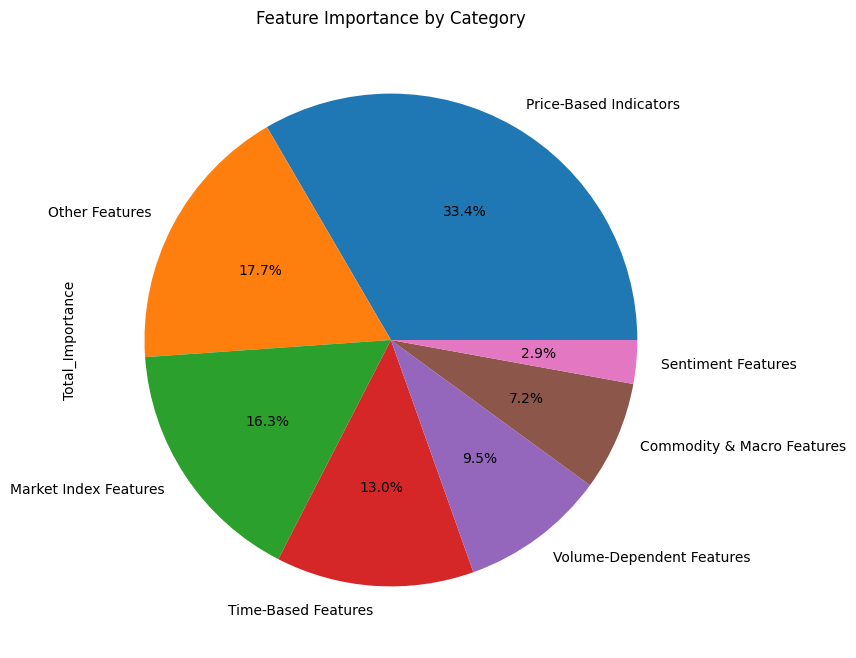

In [14]:
# 🧮 Feature importance grouped by defined categories

# Step 1: Define the categories and their features
category_map = {
    "Time-Based Features": [
        'Date', 'Day_of_Week', 'Month', 'Quarter', 'Week_of_Year'
    ],
    "Volume-Dependent Features": [
        'Volume_x', 'VWAP_x', 'OBV', 'OBV_Change', 'Volume_Change',
        'Volume_Change_Percent', 'Volume_Ratio', 'Price_Volume_Product',
        'Lag_Volume_x_1', 'Lag_Volume_x_5', 'Lag_Volume_x_10', 'Rolling_Std_Volume'
    ],
    "Price-Based Indicators": [
        'SMA_20', 'EMA_20', 'WMA_20', 'MACD_x', 'MACD_Signal_x', 'MACD_Hist_x',
        'Upper_Band', 'Middle_Band', 'Lower_Band', 'ATR_14', 'RSI_14', 'Stoch_K',
        'Stoch_D', 'SAR', 'CCI_20', 'ROC', 'ROC_5', 'ROC_10', 'Rolling_Mean_Close',
        'Rolling_Max_Close', 'Rolling_Min_Close', 'Rolling_Std_Close',
        'Rolling_Price_Range', 'Rolling_Return', 'Z_Score_Close', 'Momentum',
        'Price_Acceleration', 'Kurtosis', 'Skewness', 'Sharpe_Ratio',
        'Fib_Level_0.236', 'Fib_Level_0.382', 'Fib_Level_0.618', 'Pivot_Point','Lag_Close_x_1', 'Lag_Close_x_5',
        'Lag_Close_x_10'
    ],
    "Sentiment Features": [
        'sentiment_score', 'Lagged_Sentiment_1', 'Lagged_Sentiment_5',
        'Lagged_Sentiment_10', 'Weighted_Sentiment_Metric'
    ],
    "Market Index Features": [
        'Market_Close', 'Market_Returns', 'Global_Close', 'Global_Returns',
        'Rolling_Beta', 'Rolling_Market_Correlation', 'Rolling_Global_Correlation',
        'SP500', 'Nifty50', 'FTSE100', 'DAX', 'Nikkei225'
    ],
    "Commodity & Macro Features": [
        'INR_USD_Close', 'USD_INR', 'Crude_Oil_Close', 'Gold_Close',
        'Crude_Oil', 'Gold', 'VIX'
    ],
    "Other Features": [
        'Open_x', 'High_x', 'Low_x', 'Close_x', 'Adj Close_x', 'Price_Change',
        'Price_Change_Percent', 'High_Low_Spread', 'Close_Open_Ratio',
        'High_Low_Ratio', 'Price_Range', 'Company_ID', 'COMPANY'  # 'Row_ID' and 'cluster' are ignored
    ]
}

# Step 2: Sum feature importances by category
category_importance = {}

for category, features in category_map.items():
    importance_sum = importances[importances.index.isin(features)].sum()
    category_importance[category] = importance_sum

# Step 3: Convert to a sorted DataFrame for display
category_importance_df = pd.DataFrame.from_dict(category_importance, orient='index', columns=['Total_Importance'])
category_importance_df = category_importance_df.sort_values(by='Total_Importance', ascending=False)

# 🎯 Display
print("\n📊 Total Feature Importance by Category:")
print(category_importance_df.round(6))

# Optional: Pie Chart
category_importance_df.plot(kind='pie', y='Total_Importance', legend=False, autopct='%1.1f%%', figsize=(8, 8), title='Feature Importance by Category')


### Presence of individual companies in each clusters

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Drop non-numeric columns and explicitly exclude 'Row_ID'
numeric_cols = clustered_test_df.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'Row_ID']

# Step 2: Make sure 'cluster' exists and is in numeric_cols
if 'cluster' not in clustered_test_df.columns:
    raise KeyError("'cluster' column not found in DataFrame")

# Step 3: Clean feature list
numeric_features_only = [col for col in numeric_cols if col != 'cluster']

# Step 4: Group by cluster and compute mean
cluster_centroids = clustered_test_df.groupby('cluster')[numeric_features_only].mean()

# Step 5: Plot using seaborn for better aesthetics and zoom
plt.figure(figsize=(40, 20), dpi=300)  # Huge size and high DPI
for cluster_label in cluster_centroids.index:
    plt.plot(
        cluster_centroids.columns,
        cluster_centroids.loc[cluster_label],
        marker='o',
        label=f'Cluster {cluster_label}'
    )

plt.title('🔍 Feature Profiles per Cluster (Zoomable, Scrollable)', fontsize=24)
plt.xlabel('Features', fontsize=18)
plt.ylabel('Average Feature Value', fontsize=18)
plt.xticks(rotation=90, fontsize=10)
plt.legend(fontsize=12, loc='upper right')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()

# Step 6: Save as very high-quality image
plt.savefig("cluster_feature_profiles.png", dpi=600)

plt.show()


/tmp/ipykernel_31/2692175232.py:35: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_31/2692175232.py:38: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  plt.savefig("cluster_feature_profiles.png", dpi=600)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


In [7]:
# Check if 'cluster' is in the columns and its type
print("\n🔎 Column type of 'cluster':", type(clustered_test_df['cluster']))


🔎 Column type of 'cluster': <class 'pandas.core.series.Series'>


In [5]:
# Copy the DataFrame
relevant_df = clustered_test_df.copy()

# Step 1: Get unique clusters and companies
clusters = sorted(relevant_df['cluster'].unique())
companies = sorted(relevant_df['Company_ID'].unique())

# Step 2: Build a company-cluster matrix with % of company's values in each cluster
company_cluster_percentage = pd.DataFrame(index=companies, columns=clusters)

# Step 3: Loop over each company and compute % of rows in each cluster
for company_id in companies:
    company_data = relevant_df[relevant_df['Company_ID'] == company_id]
    total_rows = len(company_data)
    
    cluster_counts = company_data['cluster'].value_counts(normalize=True) * 100
    
    for cluster_label in clusters:
        company_cluster_percentage.loc[company_id, cluster_label] = cluster_counts.get(cluster_label, 0.0)

# Convert to float
company_cluster_percentage = company_cluster_percentage.astype(float)

# Step 4: Print percentages per cluster
for cluster_label in clusters:
    print(f"\n🔹 Cluster {cluster_label} - % of each company present in this cluster:")
    for company_id in companies:
        pct = company_cluster_percentage.loc[company_id, cluster_label]
        if pct > 0:
            print(f"   • Company {company_id}: {pct:.2f}% of its rows")


🔹 Cluster 0 - % of each company present in this cluster:
   • Company ABB: 85.83% of its rows
   • Company ADANIENT: 82.69% of its rows
   • Company ADANIGREEN: 19.31% of its rows
   • Company ADANIPORTS: 52.24% of its rows
   • Company ADANIPOWER: 28.41% of its rows
   • Company AMBUJACEM: 42.69% of its rows
   • Company APOLLOHOSP: 43.74% of its rows
   • Company ASIANPAINT: 44.72% of its rows
   • Company AXISBANK: 47.79% of its rows
   • Company BAJAJ-AUTO: 26.28% of its rows
   • Company BAJAJFINSV: 26.62% of its rows
   • Company BAJAJHLDNG: 37.50% of its rows
   • Company BAJFINANCE: 69.48% of its rows
   • Company BANKBARODA: 28.08% of its rows
   • Company BEL: 51.47% of its rows
   • Company BHARTIARTL: 50.15% of its rows
   • Company BOSCHLTD: 33.14% of its rows
   • Company BPCL: 40.76% of its rows
   • Company BRITANNIA: 36.29% of its rows
   • Company CANBK: 17.93% of its rows
   • Company CGPOWER: 79.75% of its rows
   • Company CHOLAFIN: 63.10% of its rows
   • Company

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Step 1: Compute the same company_cluster_percentage from before
# (Assume it's already available here as a DataFrame: index=Company_IDs, columns=cluster labels)

# Step 2: Sort companies by max cluster participation for readability (optional)
company_cluster_percentage['max_cluster'] = company_cluster_percentage.max(axis=1)
company_cluster_percentage = company_cluster_percentage.sort_values(by='max_cluster', ascending=False)
company_cluster_percentage = company_cluster_percentage.drop(columns='max_cluster')

# Step 3: Prepare for plotting
clusters = company_cluster_percentage.columns
companies = company_cluster_percentage.index
colors = plt.cm.get_cmap('tab20', len(clusters))  # Nice contrastive palette

# Step 4: Create horizontal stacked bar plot
fig, ax = plt.subplots(figsize=(20, 30), dpi=300)

bottoms = np.zeros(len(companies))  # Starting point for each stacked bar

for i, cluster in enumerate(clusters):
    values = company_cluster_percentage[cluster].values
    ax.barh(companies, values, left=bottoms, color=colors(i), edgecolor='white', label=f"Cluster {cluster}")
    bottoms += values

# Styling
ax.set_xlabel('Percentage of Company Data in Cluster (%)', fontsize=14)
ax.set_ylabel('Company ID', fontsize=14)
ax.set_title('📊 Cluster Composition per Company (Horizontal Stacked Bar)', fontsize=18, pad=20)
ax.legend(title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
ax.grid(axis='x', linestyle='--', linewidth=0.5)

plt.tight_layout()

# Save high-res image
plt.savefig("company_cluster_horizontal_stacked.png", dpi=600)
plt.show()


/tmp/ipykernel_31/1248664838.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(clusters))  # Nice contrastive palette
/tmp/ipykernel_31/1248664838.py:36: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_31/1248664838.py:39: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.savefig("company_cluster_horizontal_stacked.png", dpi=600)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


### Identifying the range of clusters for each feature

/tmp/ipykernel_31/1372669517.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 0.7 * len(clusters)))  # Horizontal bars
/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


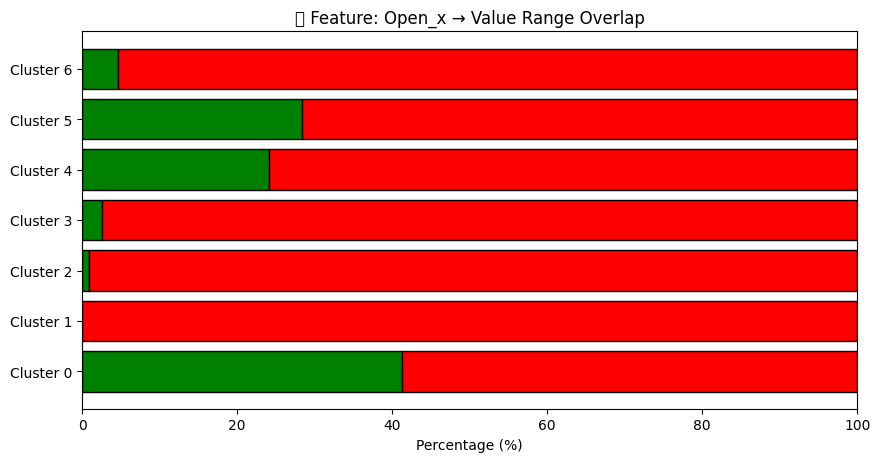

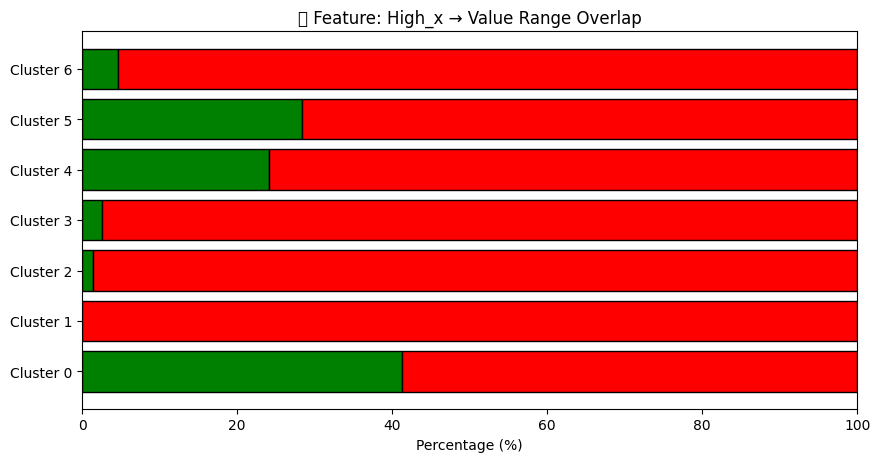

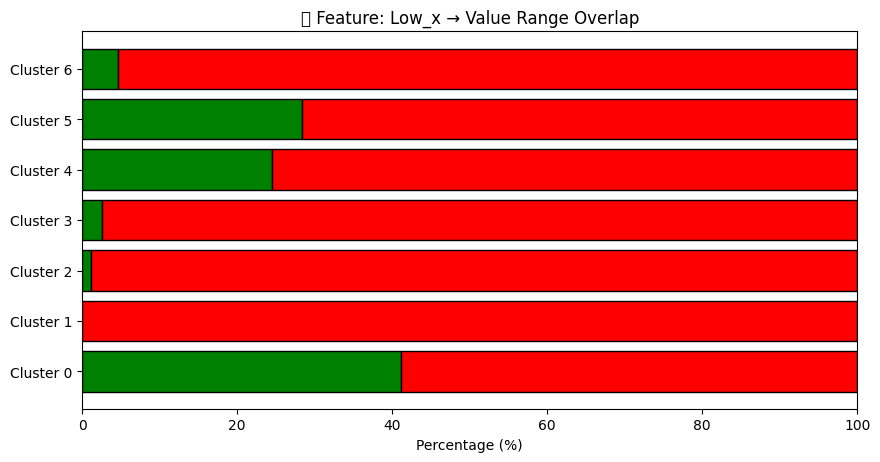

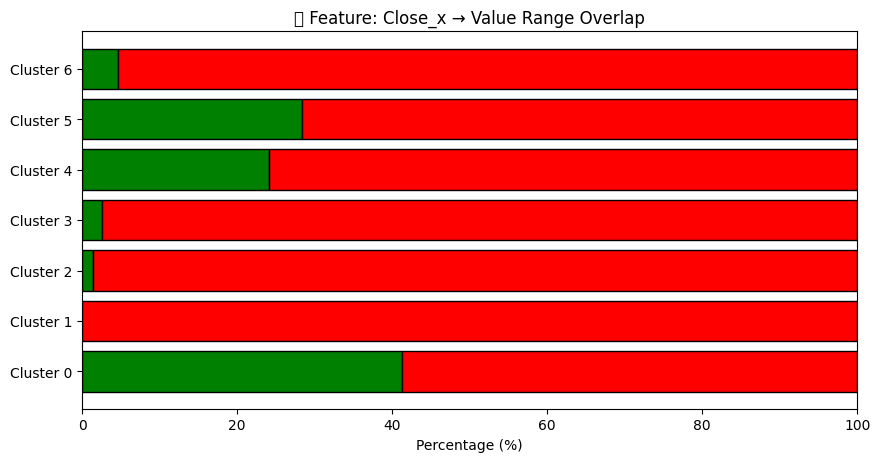

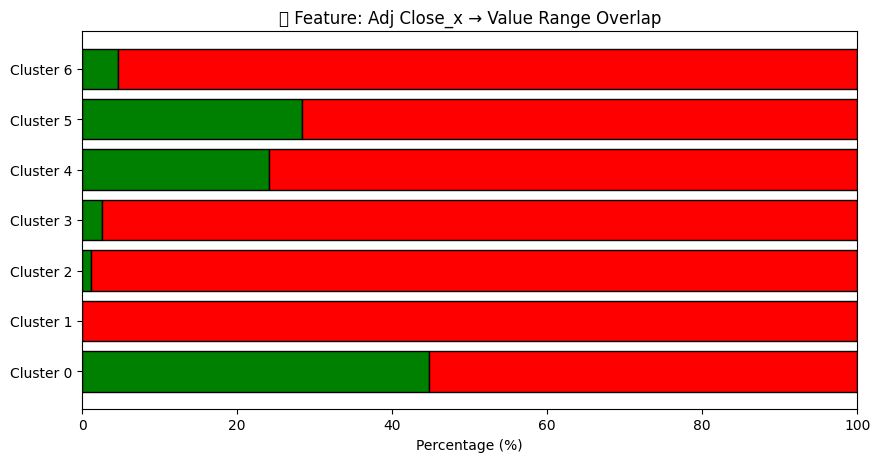

...

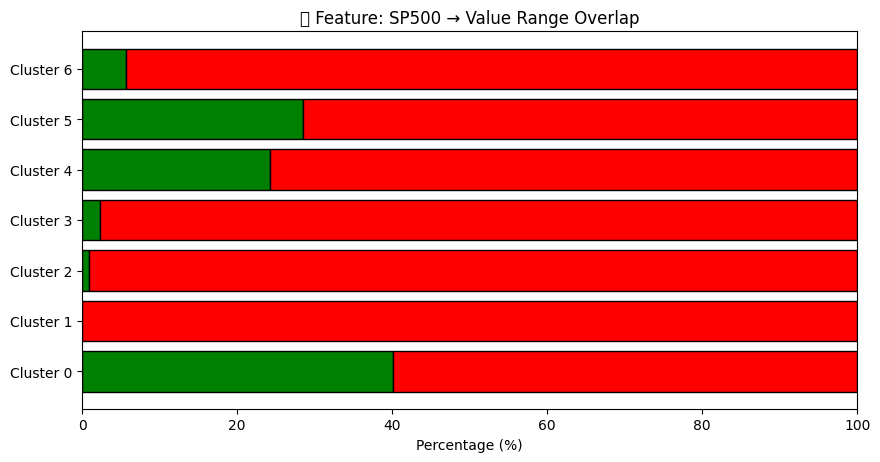

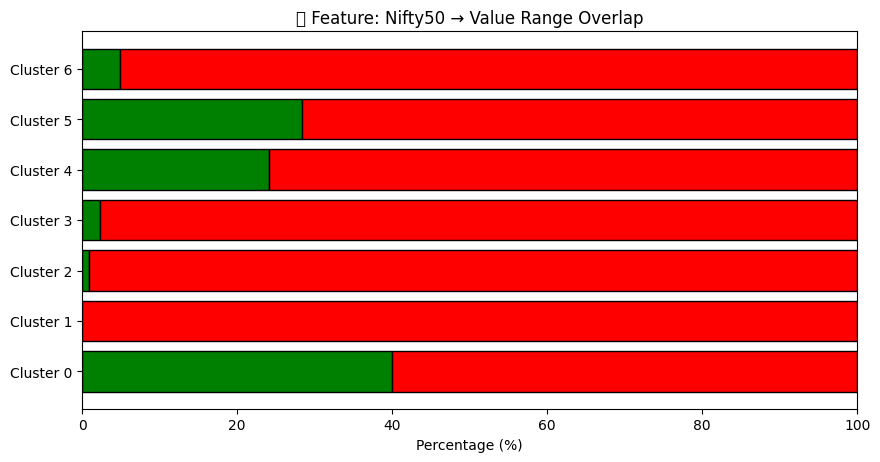

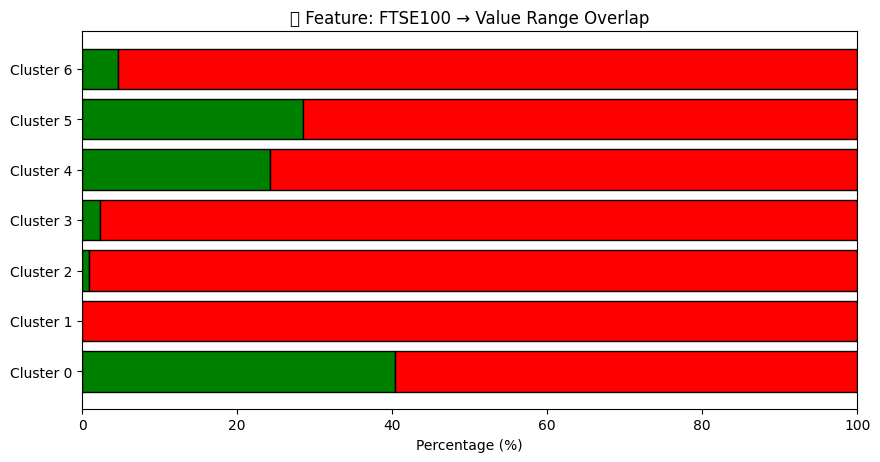

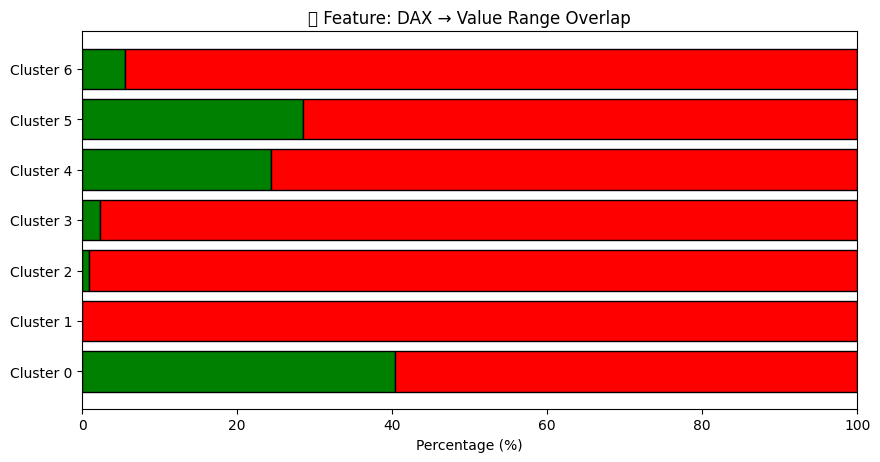

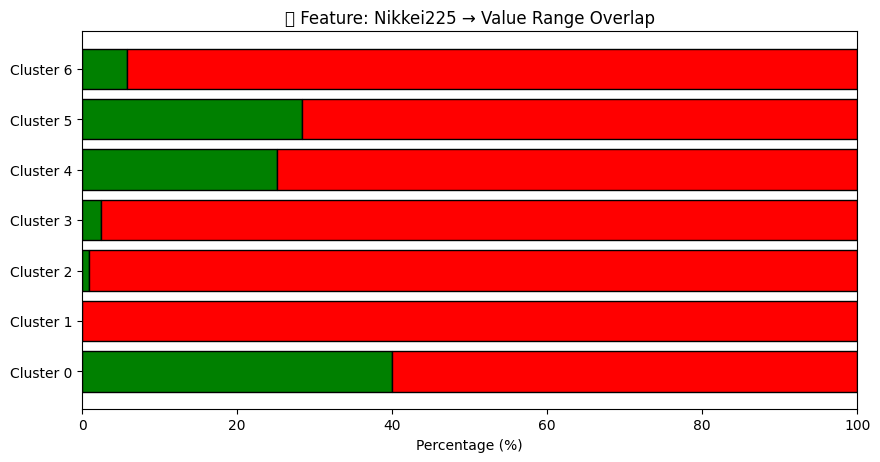

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# 🔹 Load your dataset
df = pd.read_csv("/kaggle/input/stock-with-clusters/clustering_data_1.csv")  # Replace with your filename

# 🔸 Remove non-numeric and unwanted columns
df = df.select_dtypes(include='number')
if 'Row_ID' in df.columns:
    df = df.drop(columns=['Row_ID'])

# ✅ Ensure 'cluster' column exists
if 'cluster' not in df.columns:
    raise ValueError("The dataset must contain a 'cluster' column.")

# 🔍 List of features (excluding the 'cluster' column)
features = [col for col in df.columns if col != 'cluster']
clusters = sorted(df['cluster'].unique())

# 📁 Create output folder to save plots
os.makedirs("cluster_feature_overlap_plots", exist_ok=True)

# 🔁 Iterate through each feature
for feature in features:
    fig, ax = plt.subplots(figsize=(10, 0.7 * len(clusters)))  # Horizontal bars

    # Collect text info to print after graph
    text_lines = []

    for i, cluster_val in enumerate(clusters):
        cluster_data = df[df['cluster'] == cluster_val][feature]
        other_data = df[df['cluster'] != cluster_val]

        cluster_min, cluster_max = cluster_data.min(), cluster_data.max()

        same_cluster_in_range = ((cluster_data >= cluster_min) & (cluster_data <= cluster_max)).sum()
        other_in_range = other_data[(other_data[feature] >= cluster_min) & (other_data[feature] <= cluster_max)]
        other_cluster_count = len(other_in_range)

        total_in_range = same_cluster_in_range + other_cluster_count

        percent_same = (same_cluster_in_range / total_in_range) * 100 if total_in_range > 0 else 0
        percent_other = 100 - percent_same if total_in_range > 0 else 0

        ax.barh(i, percent_same, color='green', label='Same Cluster' if i == 0 else "", edgecolor='black')
        ax.barh(i, percent_other, left=percent_same, color='red', label='Other Clusters' if i == 0 else "", edgecolor='black')
        ax.set_yticks(range(len(clusters)))
        ax.set_yticklabels([f"Cluster {val}" for val in clusters])
        ax.set_xlim(0, 100)
        ax.set_title(f"🔍 Feature: {feature} → Value Range Overlap")
        ax.set_xlabel("Percentage (%)")

        text_lines.append(
            f"Cluster {cluster_val} range: [{cluster_min:.2f}, {cluster_max:.2f}] → "
            f"{percent_same:.2f}% same cluster, {percent_other:.2f}% other clusters"
        )


In [1]:
import pandas as pd

# 🔹 Load your dataset
df = pd.read_csv("/kaggle/input/stock-with-clusters/clustering_data_1.csv")  # Change path if needed

# 🔸 Keep only numeric columns (exclude non-numeric and 'Row_ID')
df = df.select_dtypes(include='number')
if 'Row_ID' in df.columns:
    df = df.drop(columns=['Row_ID'])

# ✅ Ensure 'cluster' exists
if 'cluster' not in df.columns:
    raise ValueError("'cluster' column is required in the dataset.")

# 🔍 Features to loop through (excluding the cluster column)
features = [col for col in df.columns if col != 'cluster']
clusters = sorted(df['cluster'].unique())

# 🔁 Loop through features and clusters
for feature in features:
    print(f"\n🔎 Feature: {feature}")
    for cluster_val in clusters:
        values = df[df['cluster'] == cluster_val][feature]
        min_val, max_val = values.min(), values.max()
        print(f"  Cluster {cluster_val}: Range = [{min_val:.4f}, {max_val:.4f}]")



🔎 Feature: Open_x
  Cluster 0: Range = [-1.0000, 0.7522]
  Cluster 1: Range = [-0.0051, 0.1376]
  Cluster 2: Range = [-1.0000, 1.0000]
  Cluster 3: Range = [-1.0000, 0.2800]
  Cluster 4: Range = [-1.0000, 1.0000]
  Cluster 5: Range = [-0.9999, 1.0000]
  Cluster 6: Range = [-1.0000, 0.7516]

🔎 Feature: High_x
  Cluster 0: Range = [-1.0000, 0.7442]
  Cluster 1: Range = [0.1122, 0.2355]
  Cluster 2: Range = [-0.8412, 1.0000]
  Cluster 3: Range = [-1.0000, 0.2572]
  Cluster 4: Range = [-1.0000, 1.0000]
  Cluster 5: Range = [-1.0000, 1.0000]
  Cluster 6: Range = [-1.0000, 0.7802]

🔎 Feature: Low_x
  Cluster 0: Range = [-1.0000, 0.7749]
  Cluster 1: Range = [-0.0809, 0.1486]
  Cluster 2: Range = [-0.9349, 1.0000]
  Cluster 3: Range = [-1.0000, 0.2040]
  Cluster 4: Range = [-1.0000, 1.0000]
  Cluster 5: Range = [-1.0000, 1.0000]
  Cluster 6: Range = [-1.0000, 0.7846]

🔎 Feature: Close_x
  Cluster 0: Range = [-1.0000, 0.7585]
  Cluster 1: Range = [0.0948, 0.3003]
  Cluster 2: Range = [-0.8454

In [2]:
import pandas as pd

# 🔹 Load your dataset
df = pd.read_csv("/kaggle/input/stock-with-clusters/clustering_data_1.csv")  # Change path if needed

# 🔸 Keep only numeric columns (exclude non-numeric and 'Row_ID')
df = df.select_dtypes(include='number')
if 'Row_ID' in df.columns:
    df = df.drop(columns=['Row_ID'])

# ✅ Ensure 'cluster' exists
if 'cluster' not in df.columns:
    raise ValueError("'cluster' column is required in the dataset.")

# 🔍 Features to loop through (excluding the cluster column)
features = [col for col in df.columns if col != 'cluster']
clusters = sorted(df['cluster'].unique())

# 🔁 Loop through features and clusters
for feature in features:
    print(f"\n🔎 Feature: {feature}")
    for cluster_val in clusters:
        values = df[df['cluster'] == cluster_val][feature]
        min_val, max_val = values.min(), values.max()
        mean_val = values.mean()
        print(f"  Cluster {cluster_val}: Range = [{min_val:.4f}, {max_val:.4f}], Mean = {mean_val:.4f}")



🔎 Feature: Open_x
  Cluster 0: Range = [-1.0000, 0.7522], Mean = -0.8449
  Cluster 1: Range = [-0.0051, 0.1376], Mean = 0.0662
  Cluster 2: Range = [-1.0000, 1.0000], Mean = -0.0046
  Cluster 3: Range = [-1.0000, 0.2800], Mean = -0.8415
  Cluster 4: Range = [-1.0000, 1.0000], Mean = -0.5905
  Cluster 5: Range = [-0.9999, 1.0000], Mean = 0.0766
  Cluster 6: Range = [-1.0000, 0.7516], Mean = -0.9185

🔎 Feature: High_x
  Cluster 0: Range = [-1.0000, 0.7442], Mean = -0.8444
  Cluster 1: Range = [0.1122, 0.2355], Mean = 0.1739
  Cluster 2: Range = [-0.8412, 1.0000], Mean = -0.0029
  Cluster 3: Range = [-1.0000, 0.2572], Mean = -0.8410
  Cluster 4: Range = [-1.0000, 1.0000], Mean = -0.5889
  Cluster 5: Range = [-1.0000, 1.0000], Mean = 0.0777
  Cluster 6: Range = [-1.0000, 0.7802], Mean = -0.9181

🔎 Feature: Low_x
  Cluster 0: Range = [-1.0000, 0.7749], Mean = -0.8448
  Cluster 1: Range = [-0.0809, 0.1486], Mean = 0.0339
  Cluster 2: Range = [-0.9349, 1.0000], Mean = -0.0080
  Cluster 3: Ra

In [4]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import random

# 🔒 Set seeds for full reproducibility
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

# 🔹 Load dataset
df = pd.read_csv("/kaggle/input/stock-with-clusters/clustering_data_1.csv")  # Adjust path if needed

# 🔸 Keep only numeric columns, drop 'Row_ID'
df = df.select_dtypes(include='number')
if 'Row_ID' in df.columns:
    df = df.drop(columns=['Row_ID'])

# ✅ Ensure 'cluster' column exists
if 'cluster' not in df.columns:
    raise ValueError("'cluster' column is required in the dataset.")

# 🎯 Treat cluster as a categorical variable
df['cluster'] = df['cluster'].astype('category')

# 🎯 Target and features
X = df.drop(columns=['cluster'])
y = df['cluster']

# 🔀 Train/test split (10% test, reproducible & stratified)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=SEED, stratify=y
)

# ✅ LightGBM Classifier
model = lgb.LGBMClassifier(
    objective='multiclass',
    num_class=len(y.unique()),
    random_state=SEED,
    n_estimators=1000,
    learning_rate=0.05,
    n_jobs=-1
)

# 🚀 Train using callbacks for early stopping
model.fit(
    X_train, y_train,
    eval_set=[(X_test, y_test)],
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=True)]
)

# 🔍 Predict & Evaluate
y_pred = model.predict(X_test)

print("\n✅ Accuracy:", accuracy_score(y_test, y_pred))
print("\n📊 Classification Report:")
print(classification_report(y_test, y_pred))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.211107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20560
[LightGBM] [Info] Number of data points in the train set: 373211, number of used features: 88
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score -0.918003
[LightGBM] [Info] Start training from score -12.136752
[LightGBM] [Info] Start training from score -4.690167
[LightGBM] [Info] Start training from score -3.788096
[LightGBM] [Info] Start training from score -1.425383
[LightGBM] [Info] Start training from score -1.261028
[LightGBM] [Info] Start training from score -3.099397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further sp

## ✅ LightGBM Classification Results

**🔢 Accuracy:** `0.8898`

---

### 📊 Classification Report

| Class | Precision | Recall | F1-score | Support |
|-------|-----------|--------|----------|---------|
| **0** | 0.88      | 0.94   | 0.91     | 16,559  |
| **2** | 0.74      | 0.49   | 0.59     | 381     |
| **3** | 0.85      | 0.43   | 0.57     | 939     |
| **4** | 0.89      | 0.86   | 0.87     | 9,970   |
| **5** | 0.91      | 0.92   | 0.91     | 11,750  |
| **6** | 0.92      | 0.71   | 0.80     | 1,869   |

---

### 🔍 Averages

| Metric        | Precision | Recall | F1-score | Support |
|---------------|-----------|--------|----------|---------|
| **Accuracy**  | —         | —      | 0.89     | 41,468  |
| **Macro avg** | 0.86      | 0.73   | 0.78     | 41,468  |
| **Weighted avg** | 0.89   | 0.89   | 0.89     | 41,468  |


In [6]:
# Check the number of rows in each cluster
cluster_counts = df["cluster"].value_counts().sort_index()

print("📊 Number of rows assigned to each cluster:\n")
print(cluster_counts)


📊 Number of rows assigned to each cluster:

cluster
0    165588
1         2
2      3809
3      9388
4     99696
5    117504
6     18692
Name: count, dtype: int64


In [7]:
import pandas as pd

# 🔹 Load your dataset
df = pd.read_csv("/kaggle/input/stock-with-clusters/clustering_data_1.csv")  # Change path if needed

# 🔸 Keep only numeric columns, drop 'Row_ID'
df = df.select_dtypes(include='number')
if 'Row_ID' in df.columns:
    df = df.drop(columns=['Row_ID'])

# ✅ Ensure 'cluster' exists
if 'cluster' not in df.columns:
    raise ValueError("'cluster' column is required in the dataset.")

# 🔍 Features to loop through (excluding 'cluster')
features = [col for col in df.columns if col != 'cluster']

# ✅ Only focus on specific clusters
target_clusters = [0, 4, 5, 6]

# 🔁 Loop through features and selected clusters
for feature in features:
    print(f"\n🔎 Feature: {feature}")
    for cluster_val in target_clusters:
        values = df[df['cluster'] == cluster_val][feature]
        min_val, max_val = values.min(), values.max()
        mean_val = values.mean()
        print(f"  Cluster {cluster_val}: Range = [{min_val:.4f}, {max_val:.4f}], Mean = {mean_val:.4f}")



🔎 Feature: Open_x
  Cluster 0: Range = [-1.0000, 0.7522], Mean = -0.8449
  Cluster 4: Range = [-1.0000, 1.0000], Mean = -0.5905
  Cluster 5: Range = [-0.9999, 1.0000], Mean = 0.0766
  Cluster 6: Range = [-1.0000, 0.7516], Mean = -0.9185

🔎 Feature: High_x
  Cluster 0: Range = [-1.0000, 0.7442], Mean = -0.8444
  Cluster 4: Range = [-1.0000, 1.0000], Mean = -0.5889
  Cluster 5: Range = [-1.0000, 1.0000], Mean = 0.0777
  Cluster 6: Range = [-1.0000, 0.7802], Mean = -0.9181

🔎 Feature: Low_x
  Cluster 0: Range = [-1.0000, 0.7749], Mean = -0.8448
  Cluster 4: Range = [-1.0000, 1.0000], Mean = -0.5889
  Cluster 5: Range = [-1.0000, 1.0000], Mean = 0.0813
  Cluster 6: Range = [-1.0000, 0.7846], Mean = -0.9185

🔎 Feature: Close_x
  Cluster 0: Range = [-1.0000, 0.7585], Mean = -0.8454
  Cluster 4: Range = [-1.0000, 1.0000], Mean = -0.5893
  Cluster 5: Range = [-1.0000, 1.0000], Mean = 0.0771
  Cluster 6: Range = [-1.0000, 0.8443], Mean = -0.9180

🔎 Feature: Adj Close_x
  Cluster 0: Range = [-1

In [10]:
import pandas as pd

# 🔹 Load your CSV file
df = pd.read_csv("/kaggle/input/stock-with-clusters/clustering_data_1.csv")

# 🔍 Group by Company_ID and cluster, count rows
group_counts = df.groupby(['Company_ID', 'cluster']).size().reset_index(name='count')

# 📊 Calculate total rows per company
total_counts = df.groupby('Company_ID').size().reset_index(name='total')

# 🔗 Merge to compute percentage
merged = pd.merge(group_counts, total_counts, on='Company_ID')
merged['percentage'] = (merged['count'] / merged['total']) * 100
merged['percentage'] = merged['percentage'].round(2)

# 📉 Sort clusters by descending percentage for each company
merged_sorted = merged.sort_values(by=['Company_ID', 'percentage'], ascending=[True, False])

# 🖨️ Loop to display output
for company in merged_sorted['Company_ID'].unique():
    print(f"\n📊 Cluster distribution for Company_ID: {company}")
    company_data = merged_sorted[merged_sorted['Company_ID'] == company]
    for _, row in company_data.iterrows():
        print(f"  • Cluster {int(row['cluster'])}: {row['percentage']}% ({row['count']} rows)")



📊 Cluster distribution for Company_ID: ABB
  • Cluster 0: 85.83% (3780 rows)
  • Cluster 5: 9.13% (402 rows)
  • Cluster 4: 4.79% (211 rows)
  • Cluster 3: 0.23% (10 rows)
  • Cluster 6: 0.02% (1 rows)

📊 Cluster distribution for Company_ID: ADANIENSOL
  • Cluster 5: 64.68% (130 rows)
  • Cluster 4: 30.85% (62 rows)
  • Cluster 2: 2.49% (5 rows)
  • Cluster 6: 1.99% (4 rows)

📊 Cluster distribution for Company_ID: ADANIENT
  • Cluster 0: 82.69% (3641 rows)
  • Cluster 5: 13.74% (605 rows)
  • Cluster 4: 1.41% (62 rows)
  • Cluster 3: 1.11% (49 rows)
  • Cluster 6: 0.86% (38 rows)
  • Cluster 2: 0.18% (8 rows)

📊 Cluster distribution for Company_ID: ADANIGREEN
  • Cluster 5: 59.25% (724 rows)
  • Cluster 4: 19.8% (242 rows)
  • Cluster 0: 19.31% (236 rows)
  • Cluster 2: 1.06% (13 rows)
  • Cluster 3: 0.49% (6 rows)
  • Cluster 6: 0.08% (1 rows)

📊 Cluster distribution for Company_ID: ADANIPORTS
  • Cluster 0: 52.24% (1725 rows)
  • Cluster 4: 24.2% (799 rows)
  • Cluster 5: 23.11% (76

In [21]:
import pandas as pd

# 🔹 Step 1: Load both datasets
original_df = pd.read_parquet('/kaggle/input/nse100-clustergan/NSE100-ClusterGAN.parquet')
cluster_df = pd.read_csv('/kaggle/input/stock-with-clusters/clustering_data_1.csv')  # has Row_ID, cluster

# 🔗 Step 2: Merge on Row_ID to add cluster info
merged_df = pd.merge(original_df, cluster_df[['Row_ID', 'cluster']], on='Row_ID', how='left')

# ✅ Ensure data is sorted by Row_ID
merged_df.sort_values(by='Row_ID', inplace=True)

# Columns to extract from each group
cols_to_extract = ['Date', 'Open_x', 'High_x', 'Low_x', 'Close_x', 'Adj Close_x', 'Volume_x', 'Company_ID']

# 📦 Step 3: Group by Company and Cluster
result = {}

for company_id in merged_df['Company_ID'].unique():
    company_data = merged_df[merged_df['Company_ID'] == company_id]
    
    for cluster_id in company_data['cluster'].dropna().unique():
        cluster_data = company_data[company_data['cluster'] == cluster_id].sort_values('Row_ID')

        row_ids = cluster_data['Row_ID'].tolist()
        groups = []
        current_group = [row_ids[0]]
        
        for i in range(1, len(row_ids)):
            if row_ids[i] == row_ids[i-1] + 1:
                current_group.append(row_ids[i])
            else:
                groups.append(current_group)
                current_group = [row_ids[i]]
        groups.append(current_group)  # add the last group
        
        enriched_groups = []
        for group in groups:
            # If the group has only 1 row, add one before and one after if available
            if len(group) == 1:
                row_index = merged_df[merged_df['Row_ID'] == group[0]].index[0]
                indices_to_take = [row_index - 1, row_index, row_index + 1]
                # Validate bounds
                indices_to_take = [i for i in indices_to_take if 0 <= i < len(merged_df)]
                rows = merged_df.iloc[indices_to_take][cols_to_extract]
            else:
                rows = merged_df[merged_df['Row_ID'].isin(group)][cols_to_extract]
            
            enriched_groups.append(rows)

        # Save result
        result[(company_id, cluster_id)] = enriched_groups

# 📌 Sample output
for (company, cluster), groups in list(result.items())[:3]:  # Just show first 3 entries
    print(f"\n📍 Company: {company} | Cluster: {cluster} | Total Groups: {len(groups)}")
    for i, g in enumerate(groups[:2]):  # First 2 groups of each to show
        print(f"  Group {i+1}:")
        print(g.to_string(index=False))


KeyError: 'Row_ID'